In [1]:
from matplotlib import pyplot as plt
import numpy as np
from time import time
from os.path import abspath, join
import sys 
from glob import glob 
import vaex
from hammer import Model
current = abspath("")
root_dir = abspath(join(current, '..', '..'))
root_data_dir = join(root_dir, "Data")
import sys
if not root_dir in sys.path: 
    sys.path.append(root_dir)

In [2]:
from utils import style, get_data

style()

In [3]:
w_dir_path = join(root_data_dir, 'MCMC-no', 'mock', 'data', 'z')
w_dir_path

'/home2/s20321005/Thesis-Project/Data/MCMC-no/mock/data/z'

In [4]:
name = "Baryon"
baryon_dir = join(root_data_dir, name)
# load baryons components
df_baryon = vaex.open(join(baryon_dir, "baryon.hdf5"))
df_baryon

#,components,rho,e_rho,sigma_z,e_sigma_z
0,Molecular gas (H2),0.0104,0.00312,3.7,0.2
1,Cold atomic gas (HI(1)),0.0277,0.00554,7.1,0.5
2,Warm atomic gas (HI(2)),0.0073,0.0007,22.1,2.4
3,Hot ionized gas (HII),0.0005,3e-05,39.0,4.0
4,Giant stars,0.0006,6e-05,15.5,1.6
...,...,...,...,...,...
7,4 < MV < 5,0.0029,0.00029,18.0,1.8
8,5 < MV < 8,0.0072,0.00072,18.5,1.9
9,MV > 8,0.0216,0.0028,18.5,4.0
10,White dwarfs,0.0056,0.001,20.0,5.0


In [5]:
index = 0
w_files = glob(join(w_dir_path, "w*"))
w_files.sort()
name = w_files[index].split("/")[-1].replace(".hdf5", "").replace("z_", "")
wdata = get_data(w_files[index])

wdata, name

((array([-33.07299628, -30.58489771, -28.09679914, -25.60870057,
         -23.120602  , -20.63250343, -18.14440487, -15.6563063 ,
         -13.16820773, -10.68010916,  -8.19201059,  -5.70391203,
          -3.21581346,  -0.72771489,   1.76038368,   4.24848225,
           6.73658081,   9.22467938,  11.71277795,  16.68897509,
          24.15327079]),
  array([0.00403618, 0.00403618, 0.00201809, 0.00403618, 0.01816283,
         0.0524704 , 0.131176  , 0.21795397, 0.49443261, 0.79512836,
         0.95052147, 0.95657575, 0.8112731 , 0.48030596, 0.23409871,
         0.08879606, 0.07063323, 0.01614474, 0.00605428, 0.01210855,
         0.00403618]),
  array([0.00285401, 0.00285401, 0.00201809, 0.00285401, 0.00605428,
         0.01029029, 0.01627038, 0.02097263, 0.03158814, 0.04005799,
         0.04379772, 0.04393698, 0.04046262, 0.03113361, 0.02173552,
         0.01338651, 0.01193919, 0.00570803, 0.00349544, 0.0049433 ,
         0.00285401])),
 'w_0.4')

# run_mcmc

In [6]:
from tqdm import tqdm
from time import time
from enum import Enum
from hammer import vel
from utils import generate_init, get_initial_position_normal

class Model(Enum):
    DM = "DM"
    DDDM = "DDDM"
    NO = "NO"
    KIN = "KIN"

def mcmc_w(w_path: str, **options):
    """
    Run MCMC

    Parameters
    ----------
    w_path: `str` = path to w data \n
    options:
        step0: `int` = 500 \n
        step: `int` = 2000 \n
        burn: `int` = 1000 \n
        it: `int` = 3 \n
        thin: `int` = 20 \n
        verbose: `bool` = True \n
        m: `int` = 10 (multiplier, `nwalker = m*ndim`)
        
    Returns
    -------
    result: `dict` = { \n
        indexes: `ndarray(shape(nparam))`, \n
        labs: `ndarray(shape(nparam))`, \n
        labels: `ndarray(shape(nparam))`, \n
        chain: `ndarray(shape(nstep,nwalker,nparam))` \n
    }
    """
    step0 = options.get("step0", 100)
    step = options.get("step", 2000)
    burn = options.get("burn", 1000)
    it = options.get("it", 3)
    thin = options.get("thin", 20)
    verbose = options.get("verbose", True)
    m = options.get("m", 10)
    if verbose: print("running...")
    name = w_path.split("/")[-1].replace(".hdf5", "").replace("z_", "")
    wdata = get_data(w_path)
    
    init = generate_init(Model.KIN)
    locs = init['locs']
    scales = init['scales']    
    indexes = init['indexes']
    labs = init['labs']
    labels = init['labels']

    ndim = len(locs)
    nwalker = m*ndim
    if verbose: print(f"mcmc... {name}")
    p0 = vel.generate_p0(nwalker, locs, scales)
    for i in tqdm(range(it), desc="mcmc"):
        t0 = time()
        chain = vel.mcmc(step0, p0, wdata,  locs, scales, parallel=True, verbose=verbose)
        t1 = time()
        if verbose: print(f"{i}: first half mcmc done {np.round(t1-t0, 2)} s")
        locs_normal, scales_normal = get_initial_position_normal(Model.KIN, chain=chain[int(step0/2):])
        p0 = vel.generate_p0(nwalker, locs_normal, scales_normal, norm=True)
        t0 = time()
        chain = vel.mcmc(step0, p0, wdata,  locs, scales, parallel=True, verbose=verbose)
        t1 = time()
        if verbose: print(f"{i}: second half mcmc done {np.round(t1-t0, 2)} s")
        p0 = chain[-1]
    chain = vel.mcmc(burn, p0, wdata,  locs, scales, parallel=True, verbose=verbose)
    p0 = chain[-1]
    chain = vel.mcmc(step, p0, wdata,  locs, scales, parallel=True, verbose=verbose)
    chain_thin = chain[::thin]
    return {
        "indexes": indexes,
        "labs": labs,
        "labels": labels,
        "chain": chain_thin
        }

In [14]:
result = mcmc_w(
    model=Model.DM,
    w_path=w_files[index],
    step0=500,
    step=10_000,
    burn=1000,
    it=2,
    thin=1,
    m=10
)

result.keys()

running...
mcmc... w_0.4


mcmc:   0%|          | 0/2 [00:00<?, ?it/s]

mcmc:  50%|█████     | 1/2 [00:00<00:00,  8.97it/s]

0: first half mcmc done 0.05 s
0: second half mcmc done 0.05 s
1: first half mcmc done 0.05 s


mcmc: 100%|██████████| 2/2 [00:00<00:00,  8.92it/s]

1: second half mcmc done 0.06 s


dict_keys(['indexes', 'labs', 'labels', 'chain'])

In [15]:
chain_thin = result['chain']
indexes = result['indexes']
labs = result['labs']
labels = result['labels']
step, nwalker, ndim = chain_thin.shape
step, nwalker, ndim

(10000, 60, 6)

# plot_chain

In [9]:
from typing import List

def plot_chain(params: np.ndarray, labels: List[str], **options: dict):
    """required:
            params: `ndarray(shape=(nstep, nwalker, nparam))` (from `get_params`) \n
            labels: `List[str]` \n
        options:
            burn: `int` = 0 \n
            figsize: `Tuple[int, int]` = (10, 10) \n
            path: `str` = None \n
            alpha: `float` = 0.1 \n
            dpi: `int` = 70 \n
            fig_kw: `Dict` = All additional keyword arguments for `.pyplot.figure`.
            """
    figsize = options.get('figsize', (10, 15))
    path = options.get('path', None)
    alpha = options.get('alpha', 0.1)
    dpi = options.get('dpi', 70)
    burn = options.get('burn', 0)
    fig_kw = options.get('fig_kw', {})

    fig, axes = plt.subplots(len(labels), figsize=figsize, sharex=True, **fig_kw)
    chain_burn = params[burn:]
    for i, label in tqdm(enumerate(labels)):
        ax = axes[i]
        ax.plot(chain_burn[:, :, i], "k", alpha=alpha)
        ax.set_xlim(0, len(chain_burn)-1)
        ax.set_ylabel(label)
        ax.yaxis.set_label_coords(-0.1, 0.5)
    if path is not None:
        fig.savefig(path, dpi=dpi)
    axes[-1].set_xlabel("step number")
    plt.show()

6it [00:00, 20.84it/s]


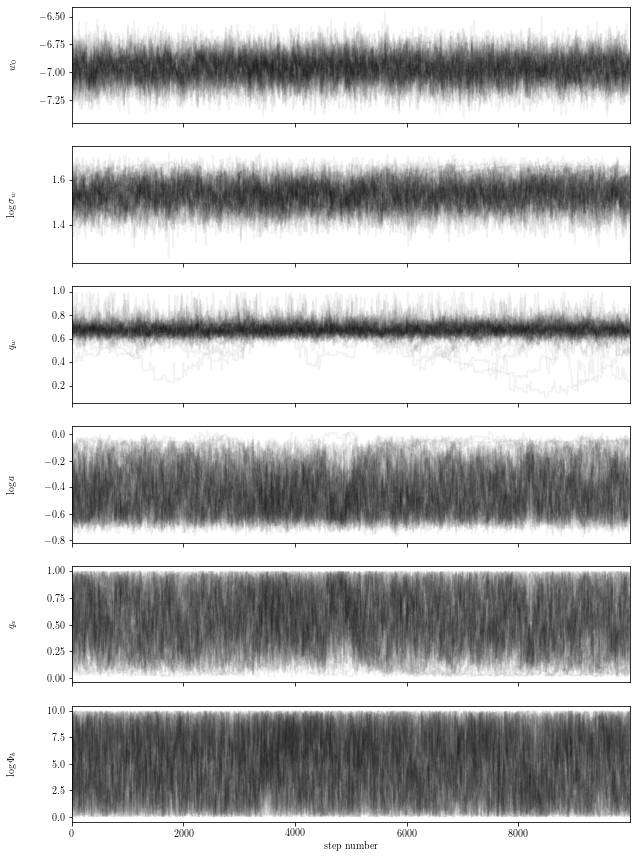

In [16]:
plot_chain(
    params=chain_thin,
    labels=labels,
    alpha=0.05
)

# plot_corner

In [11]:
from corner import corner

def plot_corner(params: np.ndarray, labels: List[str], **options: dict):
    """required: 
            params: `ndarray(shape=(nstep, nwalker, nparam))` (from `get_params`) \n
            labels: `List[str]` \n
        options:
            burn: `int` = 0 \n
            path: `str` = None \n
            dpi: `int` = 70 \n
            truths: `List[float]` = None (list of the real values) \n
            corner_kw: `Dict` = All additional keyword arguments for `corner.corner`."""
    
    burn = options.get('burn', 0)
    path = options.get('path', None)
    dpi = options.get('dpi', 70)
    truths = options.get('truths', None)
    corner_kw = options.get('corner_kw', {})

    fig = corner(params[burn:]. 
                    reshape((-1, len(labels))), 
                labels=labels,
                quantiles=[0.16, 0.5, 0.84],
                show_titles=True, title_fmt=".2f", 
                title_kwargs={"fontsize": 12},
                truths=truths,
                **corner_kw
                )
    if path is not None:
        fig.savefig(path, dpi=dpi)
    plt.show()

In [12]:
truths =[-7.00000000e+00,  1.60943791e+00,  5.00000000e-01,
        0.00000000e+00,  1.00000000e-01]

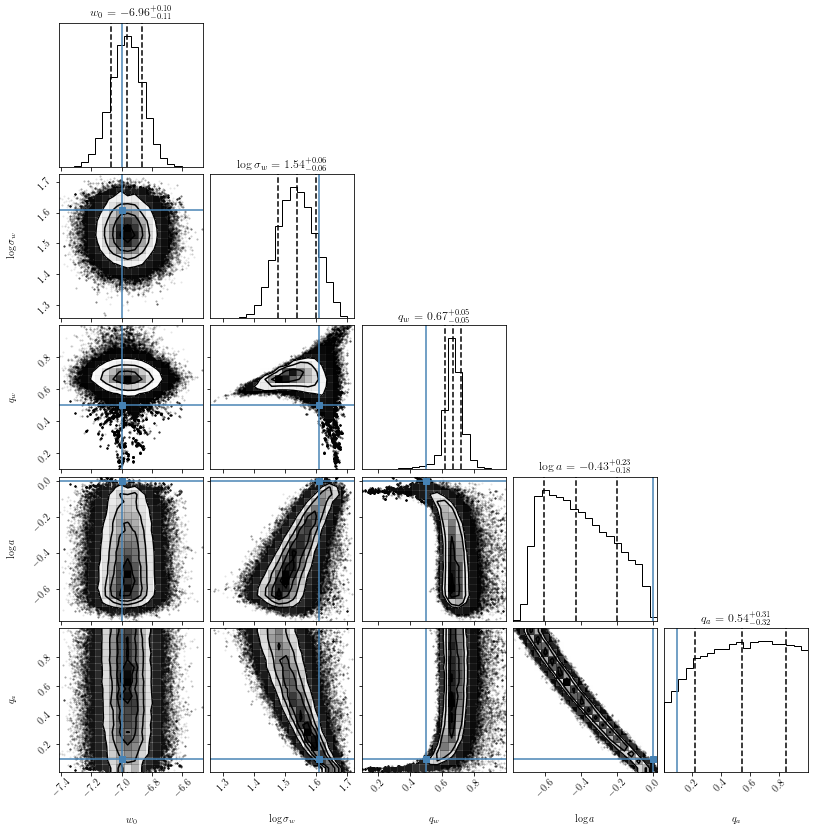

In [17]:
plot_corner(
    params=chain_thin[:, :, :-1],
    labels=labels[:-1],
    truths=truths
)

# plot_fit

In [19]:
from typing import Tuple
from tqdm import tqdm

sigma_68 = 0.994458
sigma_90 = 1.644854
sigma_95 = 1.959964

def plot_fit_w(flat_chain: np.ndarray, wdata: Tuple[np.ndarray, np.ndarray, np.ndarray], **options: dict):
    """required: 
            flat_chain: `ndarray(shape=(nsample, nparam))`\n
            wdata: `Tuple[np.ndarray, np.ndarray, np.ndarray]` (w data)\n
        options:
            res: `int` = 100 \n
            nsample: `int` = 5_000 \n
            figsize: `Tuple[int, int]` = (10, 10) \n
            alpha: `float` = 0.1 \n
            c: `str` = C0 \n
            log: `bool` = False \n
            dpi: `int` = 70 \n
            path: `str` = None \n
            fig_kw: `Dict` = All additional keyword arguments for `.pyplot.figure`.
            """
    res = options.get('res', 100)
    nsample = options.get('nsample', 5_000)
    figsize = options.get('figsize', (10, 6))
    alpha = options.get('alpha', 0.1)
    c = options.get('c', "C0")
    log = options.get('log', False)
    dpi = options.get('dpi', 70)
    path = options.get('path', None)
    fig_kw  = options.get('fig_kw', {})

    wmid, wnum, werr = wdata
    ws: np.ndarray[np.float64] = np.linspace(wmid.min()*1.1, wmid.max()*1.1, res)
    log_fws = np.empty((nsample, len(ws)))
    for i in tqdm(range(nsample)):
        ind = np.random.randint(len(flat_chain))
        theta = flat_chain[ind]
        log_fws[i] = np.log(vel.fw(ws, theta))

    fw_log_mean = log_fws.mean(axis=0)
    fw_log_std = log_fws.std(axis=0)

    fig, ax = plt.subplots(1, 1, figsize=figsize, **fig_kw)
    ax.errorbar(wmid, wnum, yerr=werr, color='k',
                alpha=1, capsize=2, fmt=".")
    ax.plot(ws, np.exp(fw_log_mean), c=c, ls="--")
    for sigma in [sigma_95, sigma_90, sigma_68]:
        ax.fill_between(ws, np.exp(fw_log_mean - sigma*fw_log_std),
                        np.exp(fw_log_mean + sigma*fw_log_std), alpha=alpha, color=c)
    ax.set_ylabel(r'$f_0({})$'.format("w"))
    ax.set_xlabel(r'${}$ [km/s]'.format("w"))
    ax.set_xlim(ws.min(), ws.max())
    if log:
        ax.set_yscale("log")
        ax.set_ylim(np.exp(fw_log_mean - sigma_95*fw_log_std).min(),
                    np.exp(fw_log_mean + sigma_95*fw_log_std).max()*1.5)
    else:
        ax.set_ylim(0)
    if path is not None:
        fig.savefig(path, dpi=dpi)
    plt.show()

100%|██████████| 50000/50000 [00:01<00:00, 35149.85it/s]


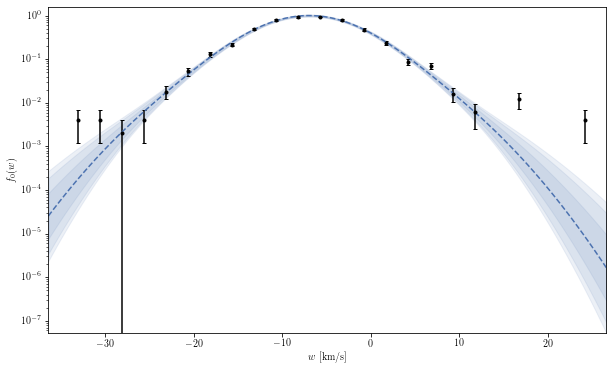

In [21]:
flat_chain = chain_thin.reshape(-1, ndim)

plot_fit_w(
    flat_chain=flat_chain,
    wdata=wdata,
    log=True,
    nsample=50_000,
    res=100
)

# Script

do mcmc for

* same $N$, different $z$
* same $z$, different $N$

Each 'running' contains
1. generate_init: initial position for walkers.
    * this is done by the experiment above.
2. run_mcmc: run true mcmc for 10_000 steps.
3. plot trace: plot trace plot for preliminary mcmc.
4. plot corner: plot corner plot for the long run.
5. plot fit: fitting plot for vertical density and vertical dispersion.
6. calculate bic & aic: calculate bic and aic for the long run.

All of these functionalities are implemented in `mcmc.py` at `utils`.

Just run the `program.py` at `script`.
To automate the process for all data, run `run_program.py` at `script`.

# test utils

In [1]:
from os.path import abspath, join
from glob import glob
import sys
current = abspath("")
root_dir = abspath(join(current, '..', '..'))
root_data_dir = join(root_dir, "Data")
import sys
if not root_dir in sys.path: 
    sys.path.append(root_dir)

In [2]:
from utils import (style, get_params, mcmc_w, plot_chain, plot_corner, plot_fit_w, get_data, Model)

style()

In [3]:
w_dir_path = join(root_data_dir, 'MCMC-no', 'mock', 'data', 'n')
w_dir_path

'/home2/s20321005/Thesis-Project/Data/MCMC-no/mock/data/n'

In [4]:
print(mcmc_w.__doc__)


    Run MCMC

    Parameters
    ----------
    w_path: `str` = path to w data 

    options:
        step0: `int` = 500 

        step: `int` = 2000 

        burn: `int` = 1000 

        it: `int` = 3 

        thin: `int` = 20 

        verbose: `bool` = True 

        m: `int` = 10 (multiplier, `nwalker = m*ndim`)
        
    Returns
    -------
    result: `dict` = { 

        indexes: `ndarray(shape(nparam))`, 

        labs: `ndarray(shape(nparam))`, 

        labels: `ndarray(shape(nparam))`, 

        chain: `ndarray(shape(nstep,nwalker,nparam))` 

    }
    


In [5]:
index = 5
w_files = glob(join(w_dir_path, "w*"))
w_files.sort()
name = w_files[index].split("/")[-1].replace(".hdf5", "").replace("w_", "")

result = mcmc_w(
    model=Model.DM,
    w_path=w_files[index],
    step0=1000,
    step=10_000,
    burn=1000,
    it=3,
    thin=20,
    m=10
)

result.keys()

running...
mcmc... w_10000


mcmc:   0%|          | 0/3 [00:00<?, ?it/s]

0: first half mcmc done 0.1 s


mcmc:  33%|███▎      | 1/3 [00:00<00:00,  4.92it/s]

0: second half mcmc done 0.09 s
1: first half mcmc done 0.08 s


mcmc:  67%|██████▋   | 2/3 [00:00<00:00,  5.25it/s]

1: second half mcmc done 0.09 s
2: first half mcmc done 0.08 s


mcmc: 100%|██████████| 3/3 [00:00<00:00,  5.32it/s]

2: second half mcmc done 0.08 s


dict_keys(['indexes', 'labs', 'labels', 'chain'])

In [6]:
indexes, labs, labels, chain = result.values()
indexes, labs, labels

([0, 1, 2, 3, 4, 5],
 array(['w0', 'log_sigmaw', 'q_sigmaw', 'log_a', 'q_a', 'log_phi_b'],
       dtype='<U32'),
 array(['$w_0$', '$\\log \\sigma_{w}$', '$q_{w}$', '$\\log a$', '$q_a$',
        '$\\log \\Phi_b$'], dtype='<U32'))

In [7]:
print(plot_chain.__doc__)

required:
            params: `ndarray(shape=(nstep, nwalker, nparam))` (from `get_params`) 

            labels: `List[str]` 

        options:
            burn: `int` = 0 

            figsize: `Tuple[int, int]` = (10, 10) 

            path: `str` = None 

            alpha: `float` = 0.1 

            dpi: `int` = 70 

            fig_kw: `Dict` = All additional keyword arguments for `.pyplot.figure`.
            


100%|██████████| 6/6 [00:00<00:00, 46.11it/s]

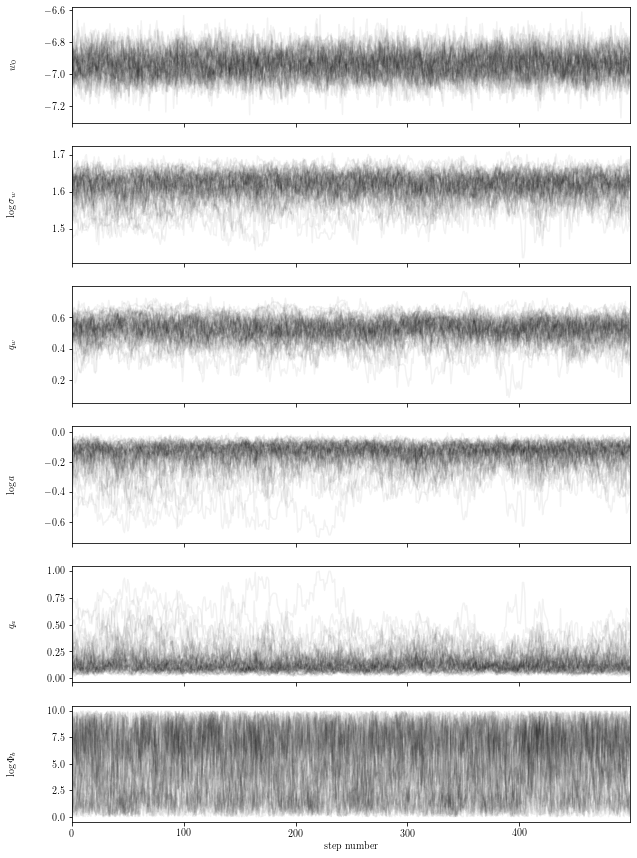

(500, 60, 6)

In [8]:
params = get_params(chain, indexes, labs)

plot_chain(
    params=params,
    labels=labels,
    alpha=0.05
)
params.shape

In [9]:
print(plot_corner.__doc__)

required: 
            params: `ndarray(shape=(nstep, nwalker, nparam))` (from `get_params`) 

            labels: `List[str]` 

        options:
            burn: `int` = 0 

            path: `str` = None 

            dpi: `int` = 70 

            truths: `List[float]` = None (list of the real values) 

            corner_kw: `Dict` = All additional keyword arguments for `corner.corner`.


In [10]:
truths =[-7.00000000e+00,  1.60943791e+00,  5.00000000e-01,
        0.00000000e+00,  1.00000000e-01]

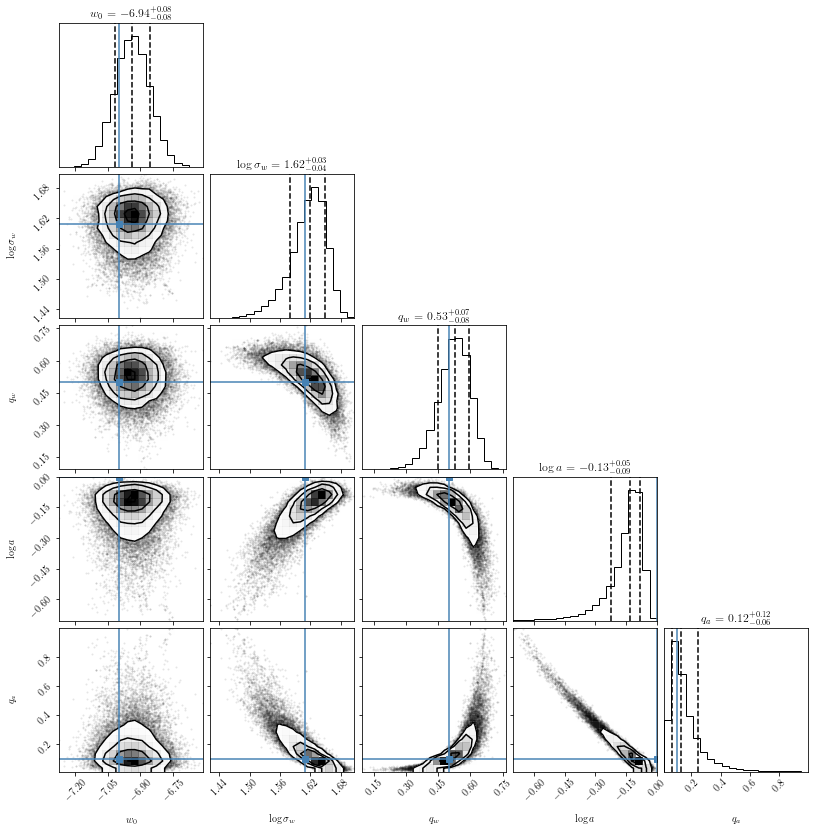

In [13]:
params = get_params(chain, indexes, labs)
plot_corner(
    params=params[:,:,:-1],
    labels=labels[:-1],
    truths=truths
)

In [14]:
print(plot_fit_w.__doc__) 

required: 
            flat_chain: `ndarray(shape=(nsample, nparam))`

            wdata: `Tuple[np.ndarray, np.ndarray, np.ndarray]` (w data)

        options:
            res: `int` = 100 

            nsample: `int` = 5_000 

            figsize: `Tuple[int, int]` = (10, 10) 

            alpha: `float` = 0.1 

            c: `str` = C0 

            log: `bool` = False 

            dpi: `int` = 70 

            path: `str` = None 

            fig_kw: `Dict` = All additional keyword arguments for `.pyplot.figure`.
            


100%|██████████| 5000/5000 [00:00<00:00, 29475.50it/s]


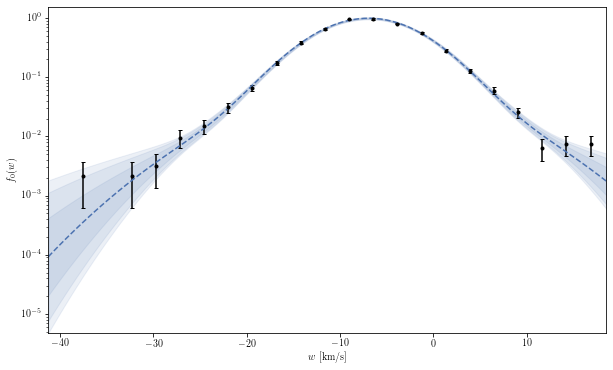

In [17]:
ndim = chain.shape[2]
flat_chain = chain.reshape((-1, ndim))
wdata = get_data(w_files[index])
plot_fit_w(
    flat_chain=flat_chain,
    wdata=wdata,
    log=True,
    nsample=5_000,
    res=100
)

# automate

In [1]:
from os.path import abspath, join
import numpy as np
from glob import glob
import sys
current = abspath("")
root_dir = abspath(join(current, '..', '..'))
root_data_dir = join(root_dir, "Data")
import sys
if not root_dir in sys.path: 
    sys.path.append(root_dir)

In [2]:
from utils import (style, get_params, mcmc_w, plot_chain, plot_corner, plot_fit_w, get_data, Model)

style()

## $z$

starting with 0.4
running...
mcmc... w_0.4


mcmc:   0%|          | 0/3 [00:00<?, ?it/s]

0: first half mcmc done 0.1 s


mcmc:  33%|███▎      | 1/3 [00:00<00:00,  4.85it/s]

0: second half mcmc done 0.09 s
1: first half mcmc done 0.09 s


mcmc:  67%|██████▋   | 2/3 [00:00<00:00,  5.09it/s]

1: second half mcmc done 0.09 s
2: first half mcmc done 0.08 s


mcmc: 100%|██████████| 3/3 [00:00<00:00,  5.16it/s]

2: second half mcmc done 0.09 s



100%|██████████| 6/6 [00:00<00:00, 46.18it/s]


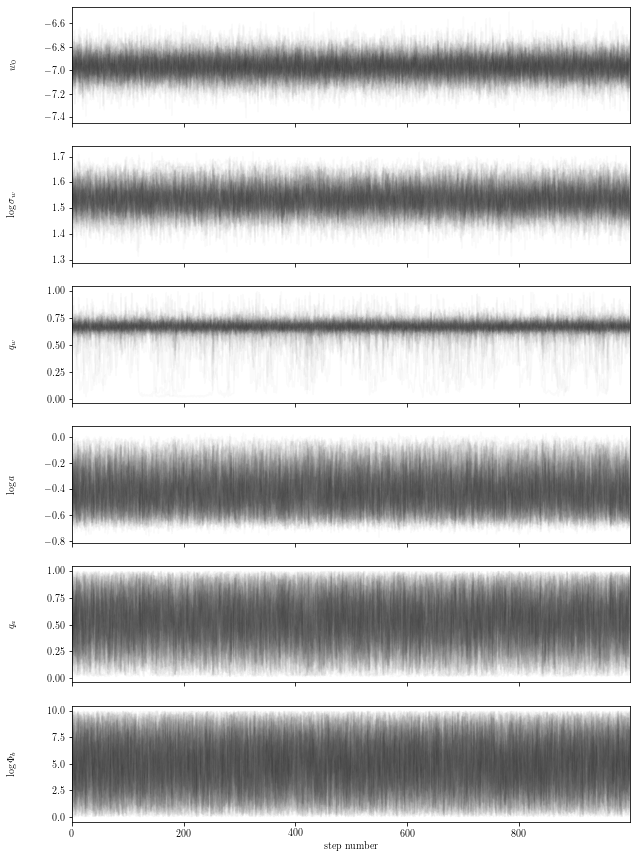

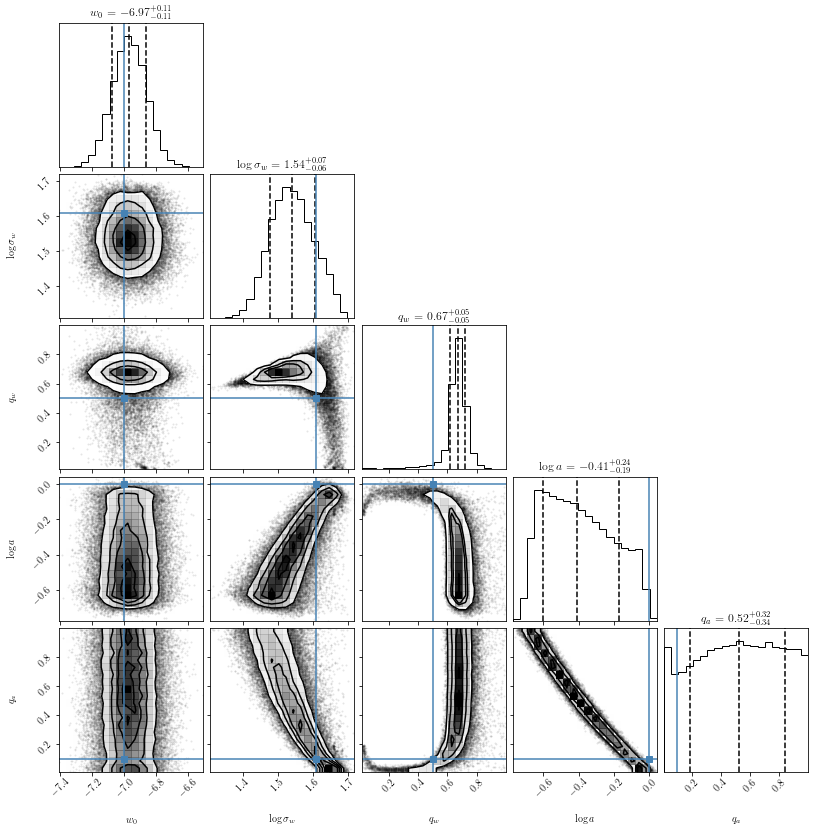

100%|██████████| 50000/50000 [00:01<00:00, 37998.97it/s]


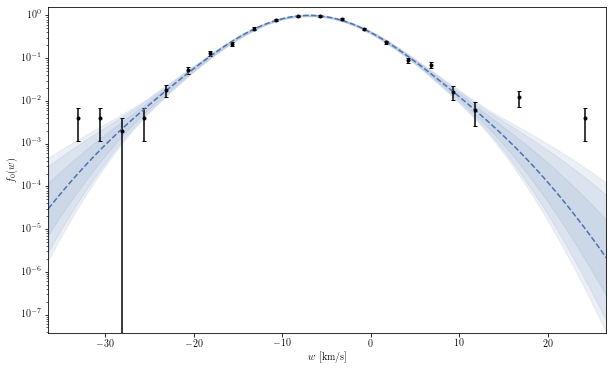

saving 0.4
starting with 0.6
running...
mcmc... w_0.6


mcmc:   0%|          | 0/3 [00:00<?, ?it/s]

0: first half mcmc done 0.15 s


mcmc:  33%|███▎      | 1/3 [00:00<00:00,  3.87it/s]

0: second half mcmc done 0.1 s
1: first half mcmc done 0.09 s


mcmc:  67%|██████▋   | 2/3 [00:00<00:00,  4.15it/s]

1: second half mcmc done 0.12 s
2: first half mcmc done 0.11 s


mcmc: 100%|██████████| 3/3 [00:00<00:00,  4.19it/s]

2: second half mcmc done 0.1 s



100%|██████████| 6/6 [00:00<00:00, 19.89it/s]


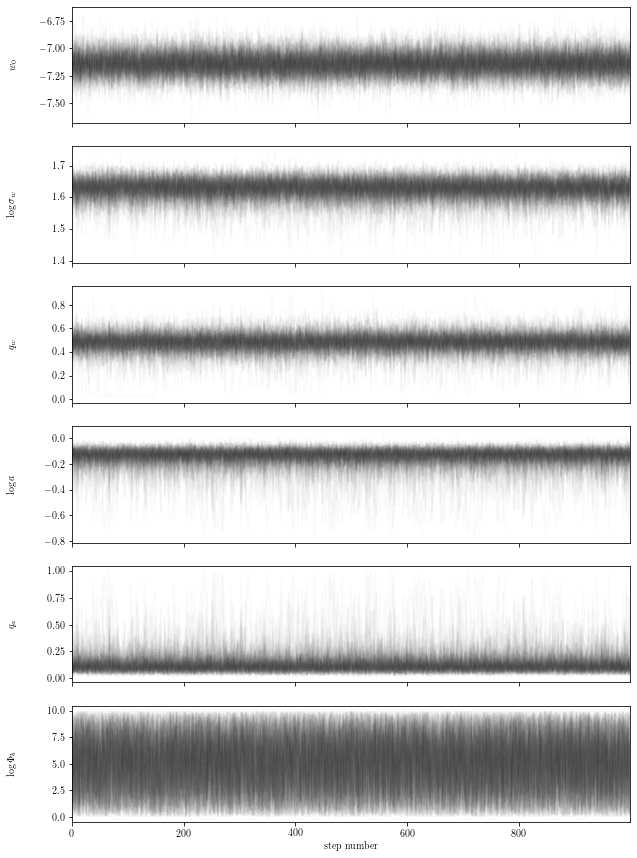

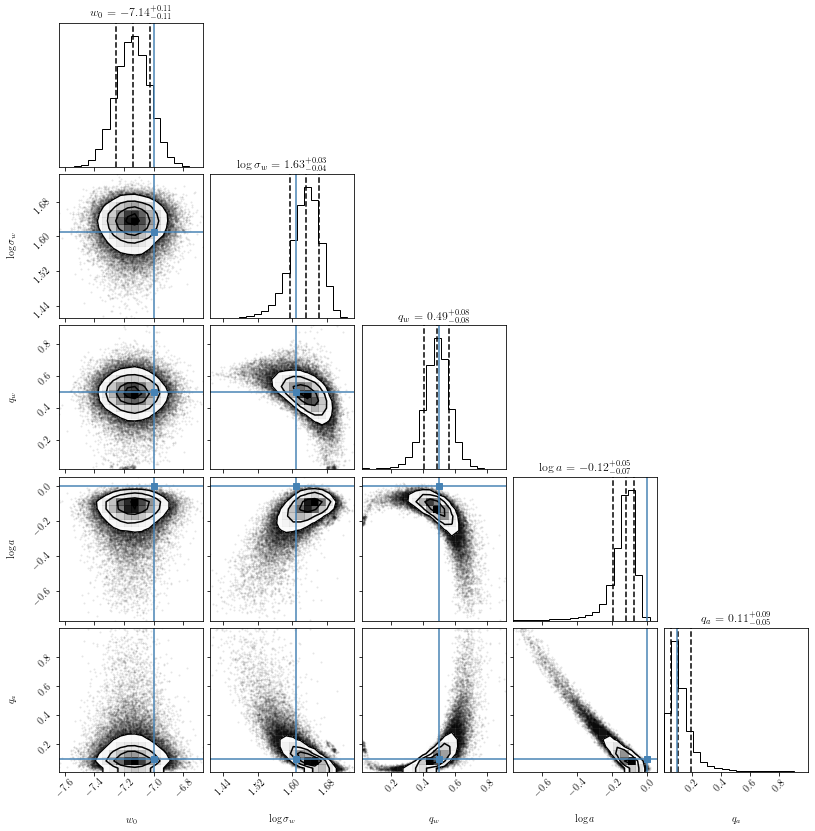

100%|██████████| 50000/50000 [00:01<00:00, 38946.13it/s]


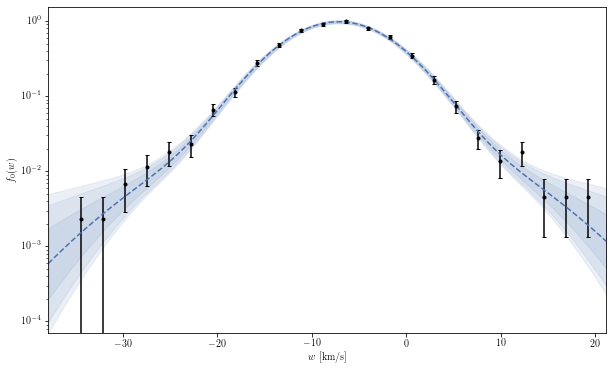

saving 0.6
starting with 0.8
running...
mcmc... w_0.8


mcmc:   0%|          | 0/3 [00:00<?, ?it/s]

0: first half mcmc done 0.11 s


mcmc:  33%|███▎      | 1/3 [00:00<00:00,  4.60it/s]

0: second half mcmc done 0.09 s
1: first half mcmc done 0.09 s


mcmc:  67%|██████▋   | 2/3 [00:00<00:00,  4.83it/s]

1: second half mcmc done 0.1 s
2: first half mcmc done 0.1 s


mcmc: 100%|██████████| 3/3 [00:00<00:00,  4.81it/s]

2: second half mcmc done 0.1 s



100%|██████████| 6/6 [00:00<00:00, 47.09it/s]


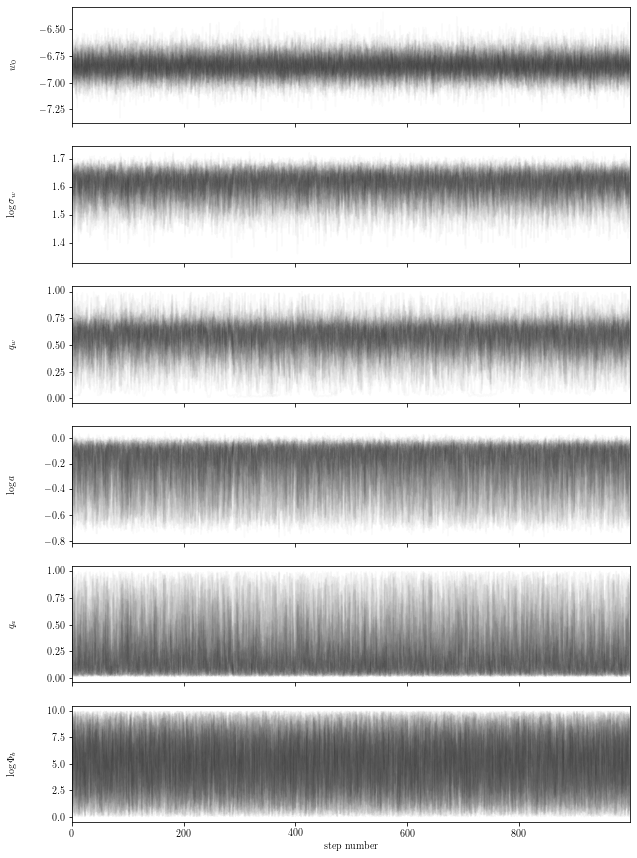

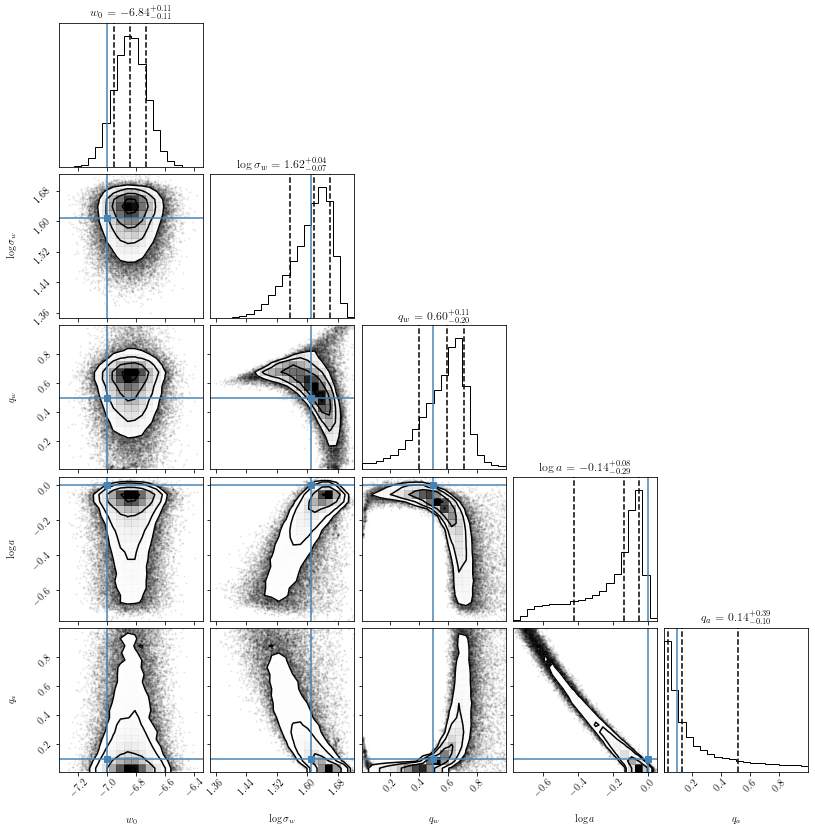

100%|██████████| 50000/50000 [00:01<00:00, 37250.05it/s]


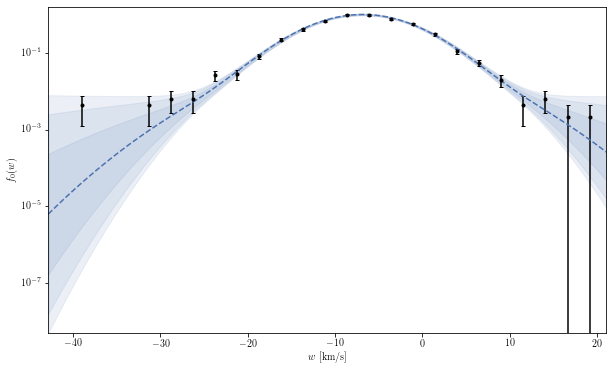

saving 0.8
starting with 1.0
running...
mcmc... w_1.0


mcmc:   0%|          | 0/3 [00:00<?, ?it/s]

0: first half mcmc done 0.1 s


mcmc:  33%|███▎      | 1/3 [00:00<00:00,  4.88it/s]

0: second half mcmc done 0.1 s
1: first half mcmc done 0.09 s


mcmc:  67%|██████▋   | 2/3 [00:00<00:00,  4.99it/s]

1: second half mcmc done 0.09 s
2: first half mcmc done 0.09 s


mcmc: 100%|██████████| 3/3 [00:00<00:00,  5.01it/s]

2: second half mcmc done 0.09 s



100%|██████████| 6/6 [00:00<00:00, 46.47it/s]


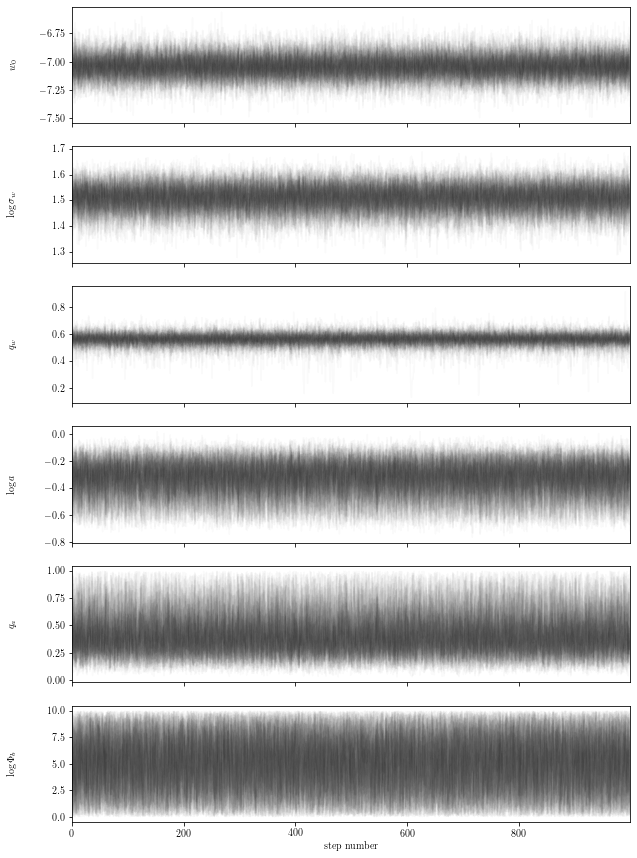

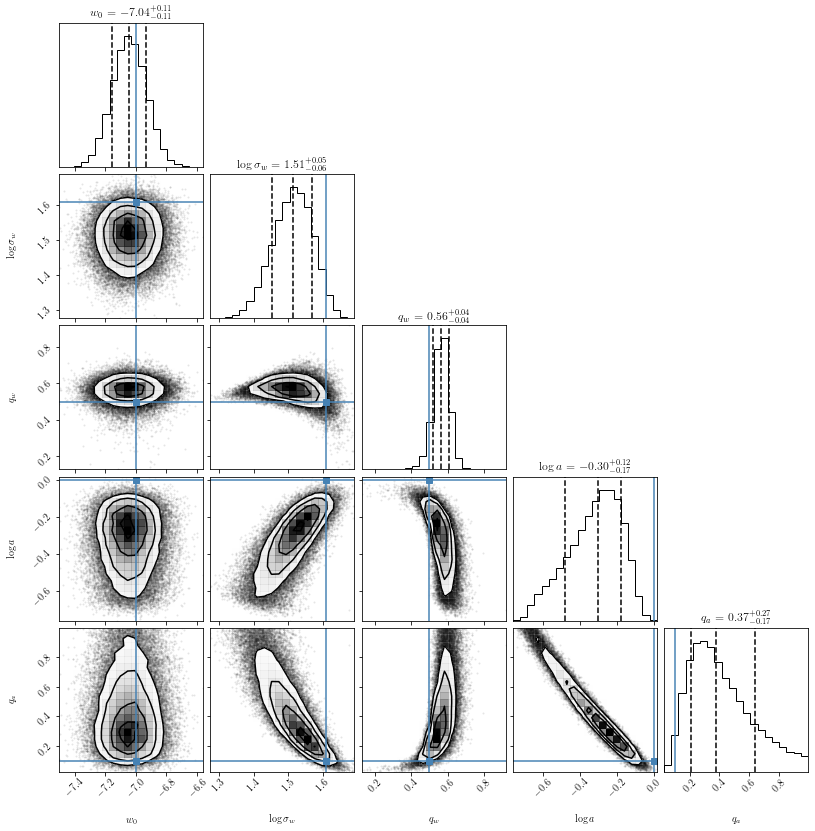

100%|██████████| 50000/50000 [00:01<00:00, 37129.69it/s]


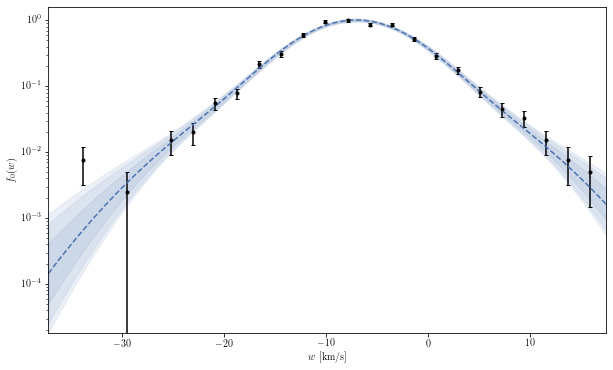

saving 1.0
starting with 1.5
running...
mcmc... w_1.5


mcmc:   0%|          | 0/3 [00:00<?, ?it/s]

0: first half mcmc done 0.1 s


mcmc:  33%|███▎      | 1/3 [00:00<00:00,  4.62it/s]

0: second half mcmc done 0.1 s
1: first half mcmc done 0.1 s


mcmc:  67%|██████▋   | 2/3 [00:00<00:00,  4.63it/s]

1: second half mcmc done 0.1 s
2: first half mcmc done 0.09 s


mcmc: 100%|██████████| 3/3 [00:00<00:00,  4.58it/s]

2: second half mcmc done 0.12 s



100%|██████████| 6/6 [00:00<00:00, 50.06it/s]


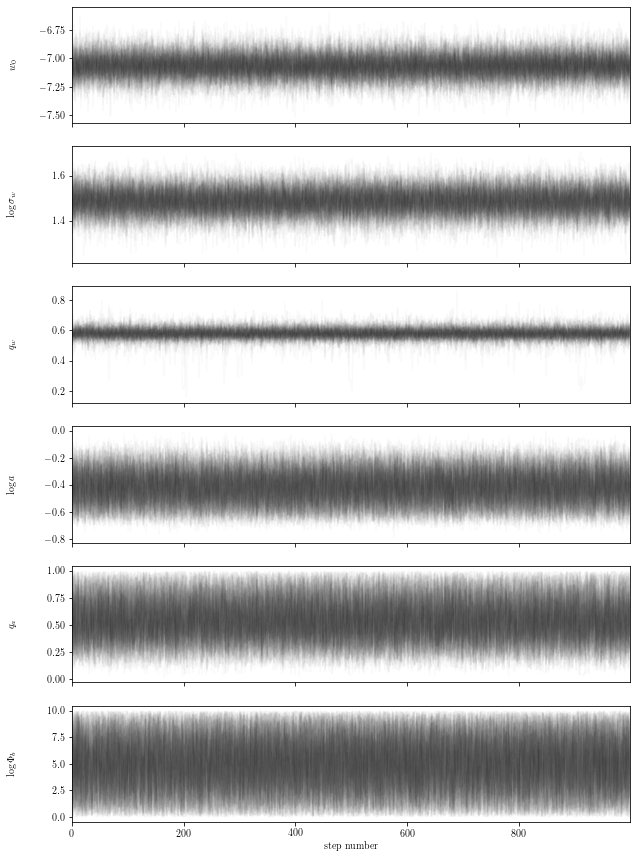

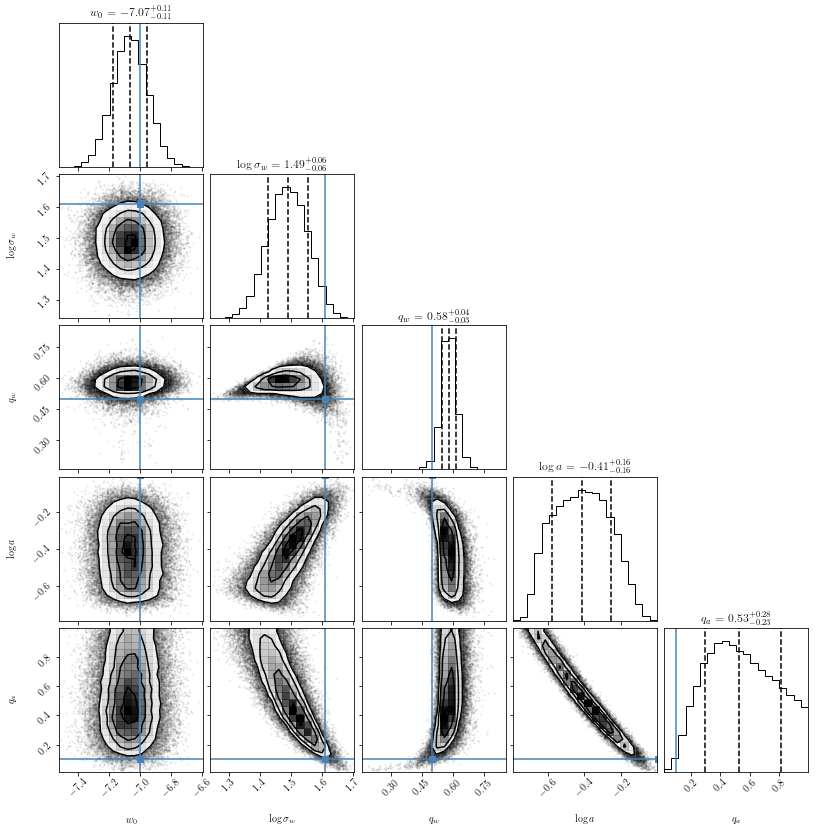

100%|██████████| 50000/50000 [00:01<00:00, 34221.11it/s]


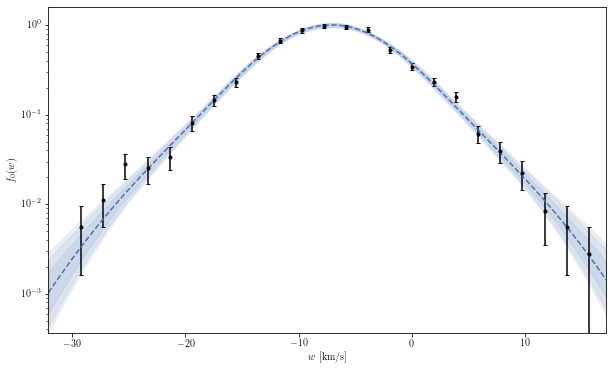

saving 1.5
starting with 2.0
running...
mcmc... w_2.0


mcmc:   0%|          | 0/3 [00:00<?, ?it/s]

0: first half mcmc done 0.1 s


mcmc:  33%|███▎      | 1/3 [00:00<00:00,  4.66it/s]

0: second half mcmc done 0.1 s
1: first half mcmc done 0.09 s


mcmc:  67%|██████▋   | 2/3 [00:00<00:00,  4.91it/s]

1: second half mcmc done 0.09 s
2: first half mcmc done 0.09 s


mcmc: 100%|██████████| 3/3 [00:00<00:00,  4.92it/s]

2: second half mcmc done 0.09 s



100%|██████████| 6/6 [00:00<00:00, 44.52it/s]


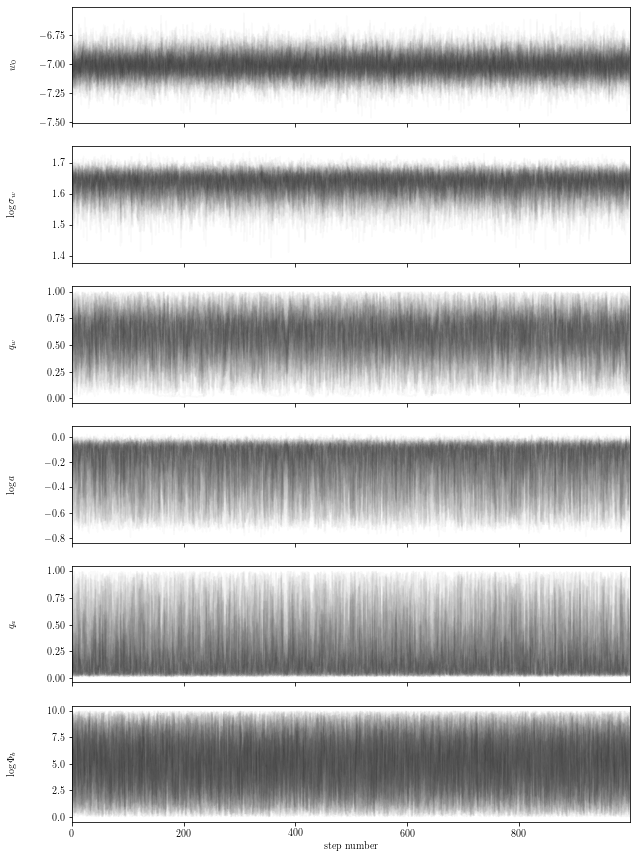

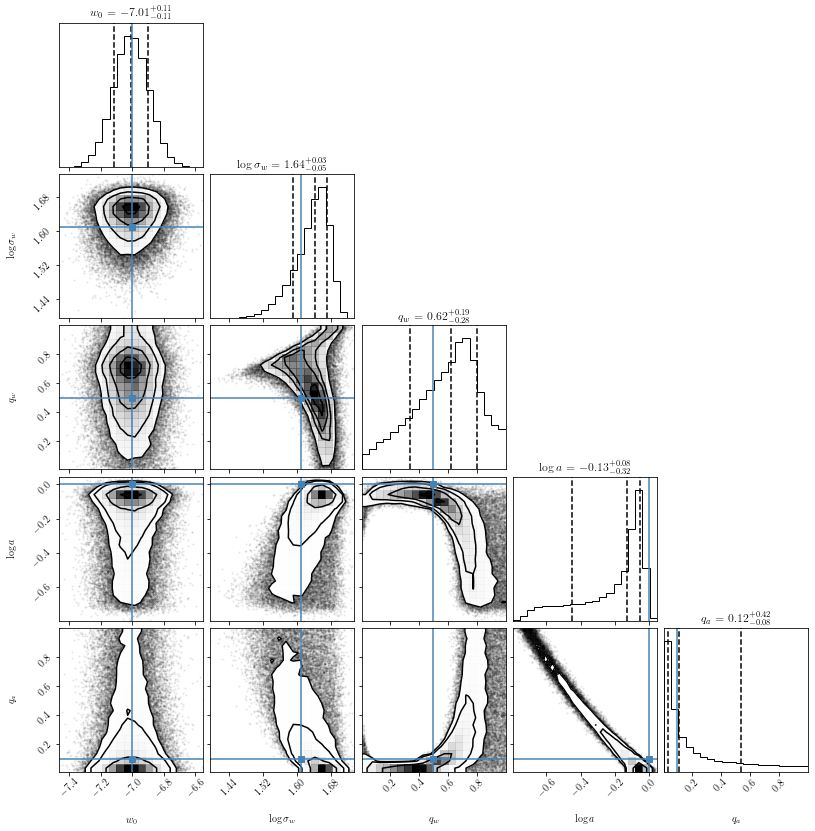

100%|██████████| 50000/50000 [00:01<00:00, 36449.03it/s]


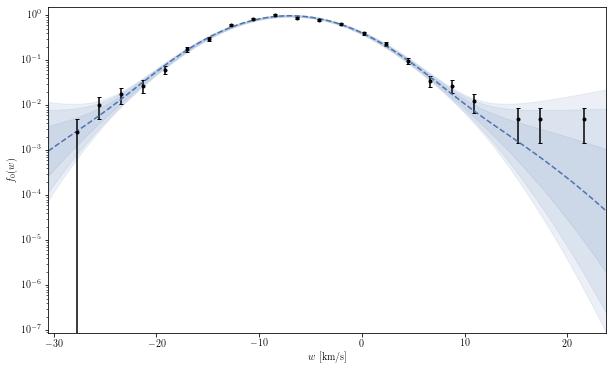

saving 2.0


In [3]:
data_dir = join(root_data_dir, "MCMC-no", "mock", "result", "z", "vel")
w_dir_path = join(root_data_dir, 'MCMC-no', 'mock', 'data', 'z')
w_files = glob(join(w_dir_path, "w*"))
w_files.sort()

truths =[-7.00000000e+00,  1.60943791e+00,  5.00000000e-01,
        0.00000000e+00,  1.00000000e-01]

for file in w_files:
    name = file.split("/")[-1].replace(".hdf5", "").replace("w_", "")
    print("starting with {}".format(name))
    result = mcmc_w(
        model=Model.DM,
        w_path=file,
        step0=1000,
        step=300_000,
        burn=1000,
        it=3,
        thin=300,
        m=10,
    )
    indexes, labs, labels, chain = result.values()
    params = get_params(chain, indexes, labs)
    plot_chain(
        params=params,
        labels=labels,
        alpha=0.02,
        path=join(data_dir, "plots", f"chain_{name}.pdf")
    )
    plot_corner(
        params=params[:,:,:-1],
        labels=labels[:-1],
        truths=truths,
        path=join(data_dir, "plots", f"corner_{name}.pdf")
    )
    ndim = chain.shape[2]
    flat_chain = chain.reshape((-1, ndim))
    wdata = get_data(file)
    plot_fit_w(
        flat_chain=flat_chain,
        wdata=wdata,
        log=True,
        nsample=50_000,
        res=100,
        path=join(data_dir, "plots", f"fit_{name}.pdf")
    )
    print("saving", name)
    np.save(join(data_dir, "data", f"chain_{name}.npy"), flat_chain[:,:-1])

## $N$

starting with 00500
running...
mcmc... w_00500


mcmc:   0%|          | 0/3 [00:00<?, ?it/s]

0: first half mcmc done 0.14 s


mcmc:  33%|███▎      | 1/3 [00:00<00:00,  4.23it/s]

0: second half mcmc done 0.08 s
1: first half mcmc done 0.08 s


mcmc:  67%|██████▋   | 2/3 [00:00<00:00,  4.97it/s]

1: second half mcmc done 0.08 s
2: first half mcmc done 0.08 s


mcmc: 100%|██████████| 3/3 [00:00<00:00,  5.10it/s]

2: second half mcmc done 0.08 s



100%|██████████| 6/6 [00:00<00:00, 24.53it/s]


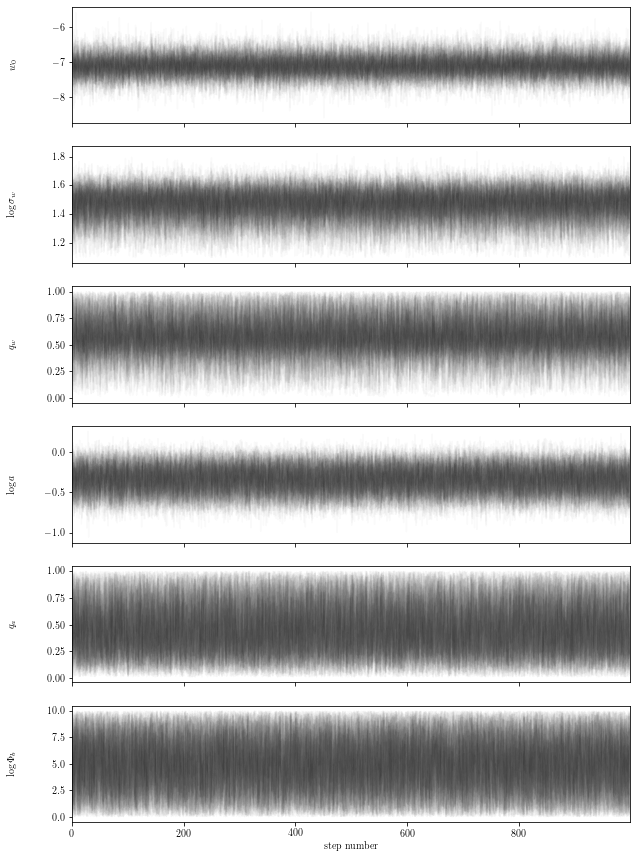

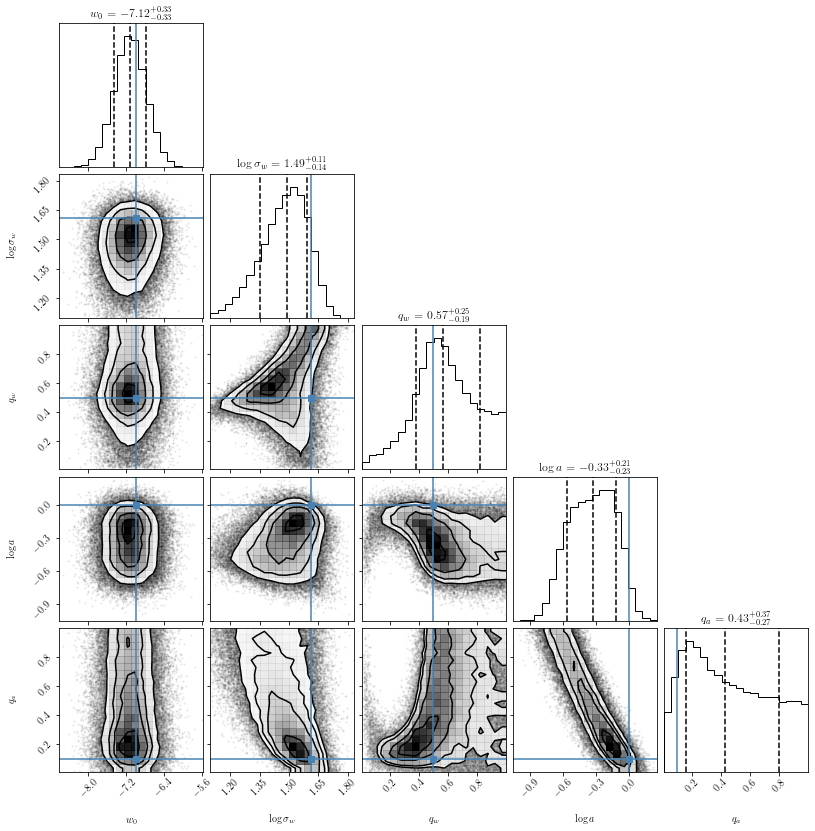

100%|██████████| 50000/50000 [00:01<00:00, 37234.59it/s]


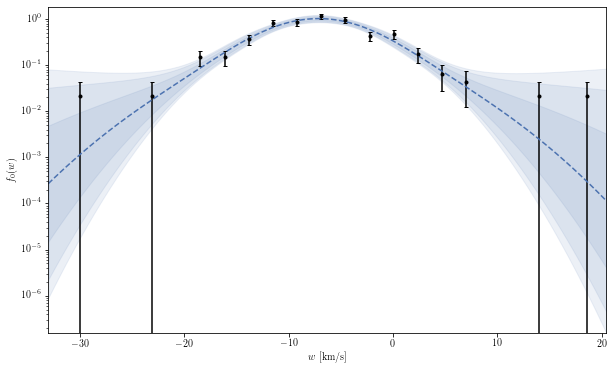

saving 00500
starting with 01000
running...
mcmc... w_01000


mcmc:   0%|          | 0/3 [00:00<?, ?it/s]

0: first half mcmc done 0.15 s


mcmc:  33%|███▎      | 1/3 [00:00<00:00,  3.95it/s]

0: second half mcmc done 0.09 s
1: first half mcmc done 0.09 s


mcmc:  67%|██████▋   | 2/3 [00:00<00:00,  4.58it/s]

1: second half mcmc done 0.09 s
2: first half mcmc done 0.09 s


mcmc: 100%|██████████| 3/3 [00:00<00:00,  4.68it/s]

2: second half mcmc done 0.09 s



100%|██████████| 6/6 [00:00<00:00, 46.17it/s]


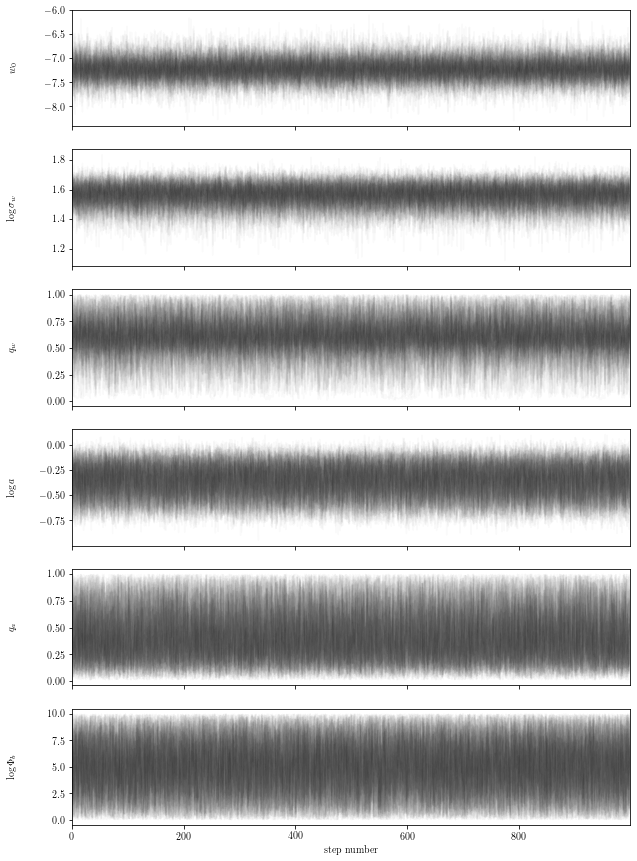

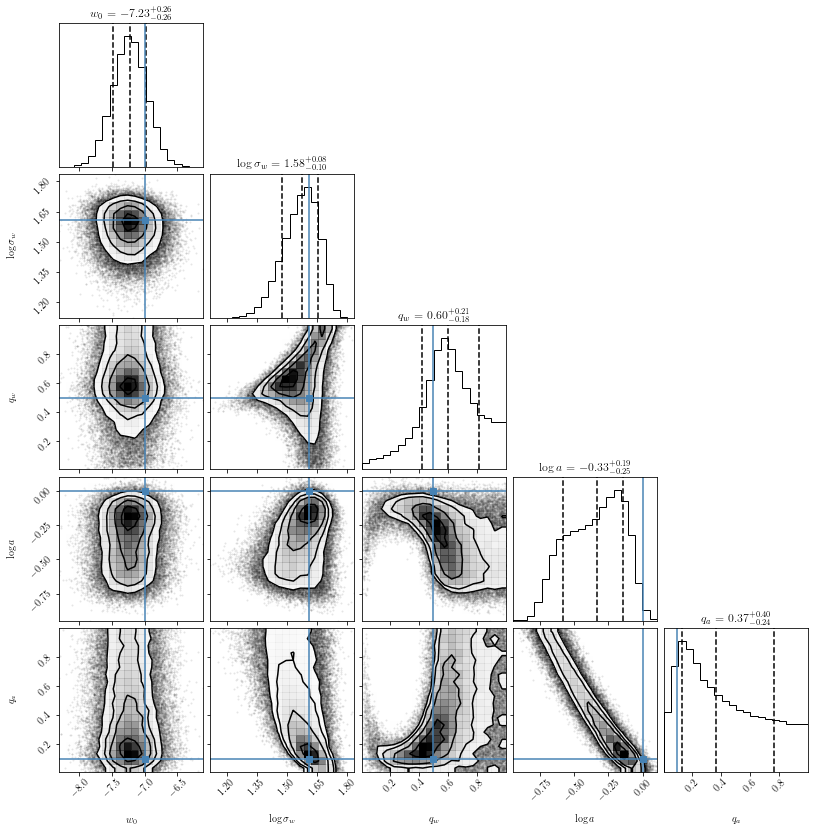

100%|██████████| 50000/50000 [00:01<00:00, 36441.22it/s]


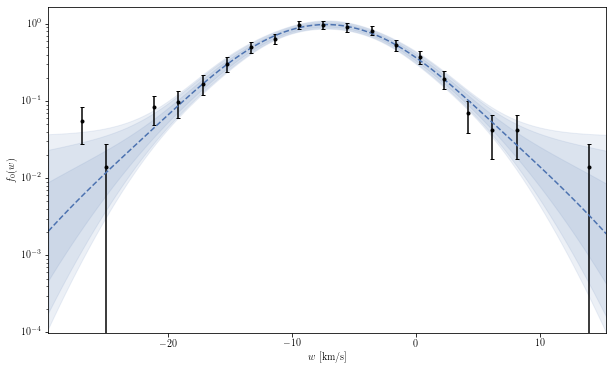

saving 01000
starting with 01500
running...
mcmc... w_01500


mcmc:   0%|          | 0/3 [00:00<?, ?it/s]

0: first half mcmc done 0.1 s


mcmc:  33%|███▎      | 1/3 [00:00<00:00,  5.04it/s]

0: second half mcmc done 0.09 s
1: first half mcmc done 0.09 s


mcmc:  67%|██████▋   | 2/3 [00:00<00:00,  5.23it/s]

1: second half mcmc done 0.09 s


mcmc: 100%|██████████| 3/3 [00:00<00:00,  5.23it/s]

2: first half mcmc done 0.08 s
2: second half mcmc done 0.09 s



100%|██████████| 6/6 [00:00<00:00, 46.33it/s]


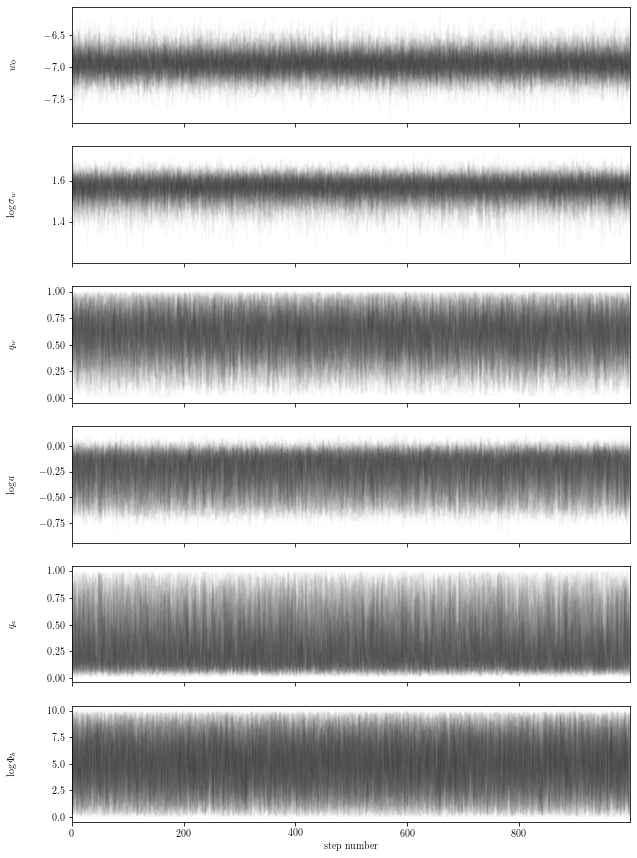

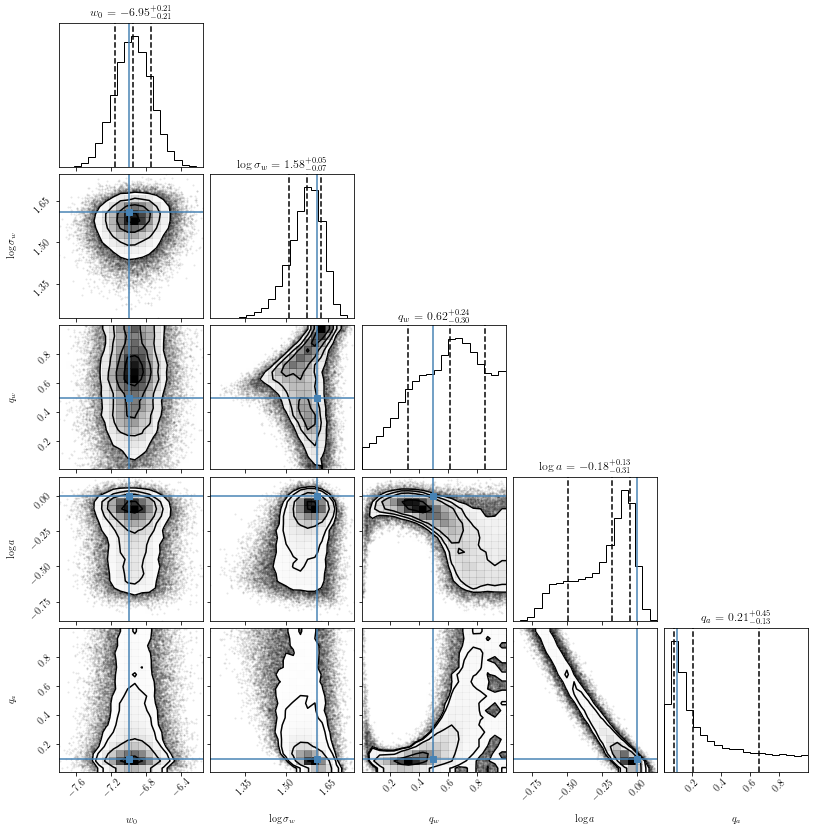

100%|██████████| 50000/50000 [00:01<00:00, 36222.93it/s]


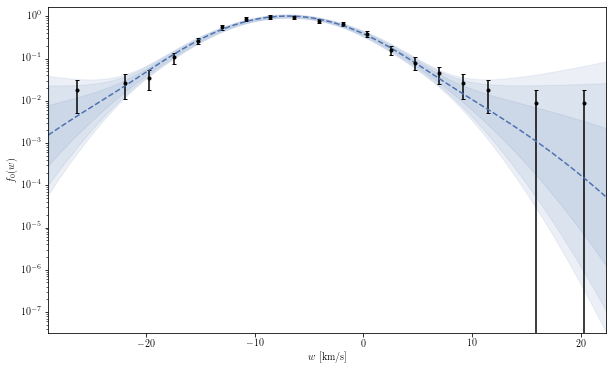

saving 01500
starting with 02000
running...
mcmc... w_02000


mcmc:   0%|          | 0/3 [00:00<?, ?it/s]

0: first half mcmc done 0.11 s


mcmc:  33%|███▎      | 1/3 [00:00<00:00,  4.20it/s]

0: second half mcmc done 0.11 s
1: first half mcmc done 0.1 s


mcmc:  67%|██████▋   | 2/3 [00:00<00:00,  4.46it/s]

1: second half mcmc done 0.1 s
2: first half mcmc done 0.09 s


mcmc: 100%|██████████| 3/3 [00:00<00:00,  4.66it/s]

2: second half mcmc done 0.09 s



100%|██████████| 6/6 [00:00<00:00, 47.60it/s]


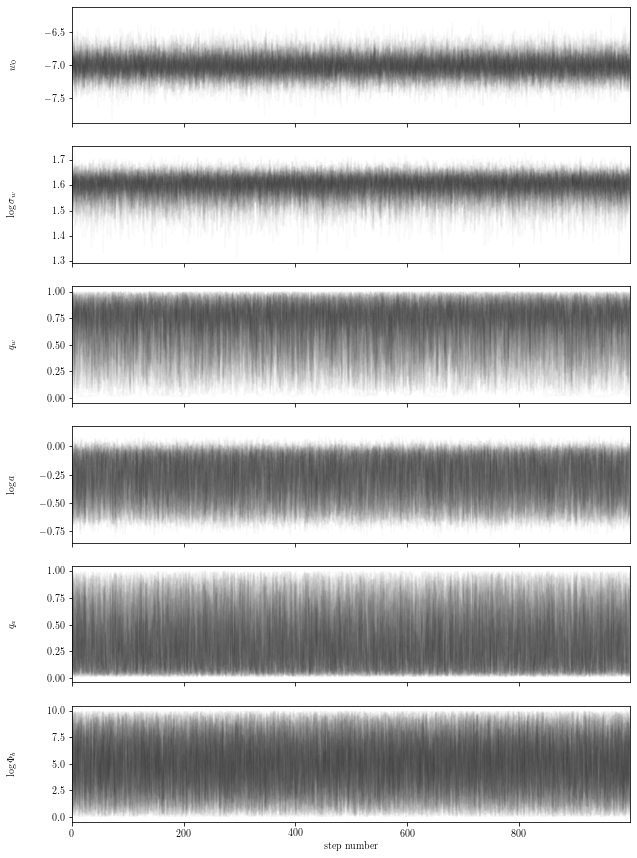

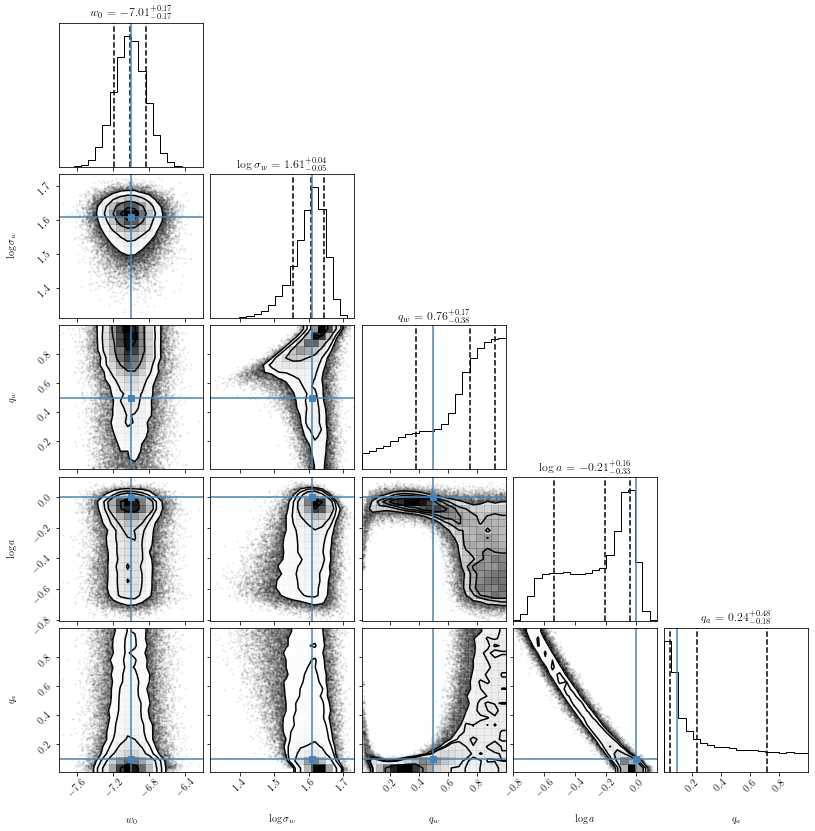

100%|██████████| 50000/50000 [00:01<00:00, 37199.81it/s]


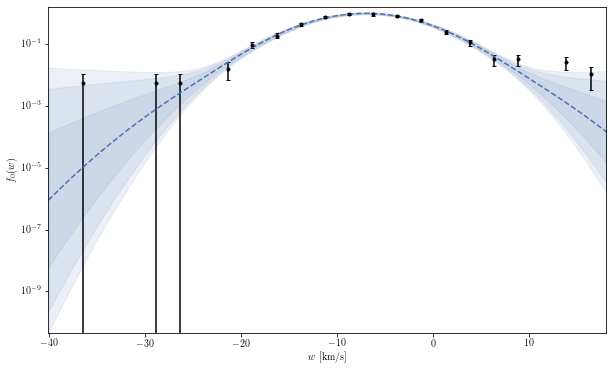

saving 02000
starting with 05000
running...
mcmc... w_05000


mcmc:   0%|          | 0/3 [00:00<?, ?it/s]

0: first half mcmc done 0.09 s


mcmc:  33%|███▎      | 1/3 [00:00<00:00,  5.20it/s]

0: second half mcmc done 0.09 s
1: first half mcmc done 0.08 s


mcmc:  67%|██████▋   | 2/3 [00:00<00:00,  5.41it/s]

1: second half mcmc done 0.08 s
2: first half mcmc done 0.08 s


mcmc: 100%|██████████| 3/3 [00:00<00:00,  5.16it/s]

2: second half mcmc done 0.11 s



100%|██████████| 6/6 [00:00<00:00, 45.65it/s]


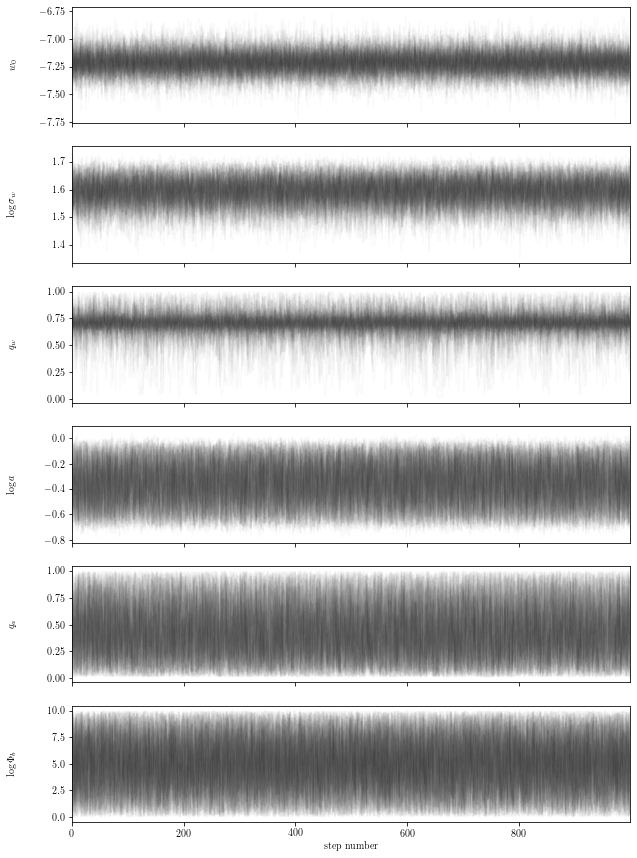

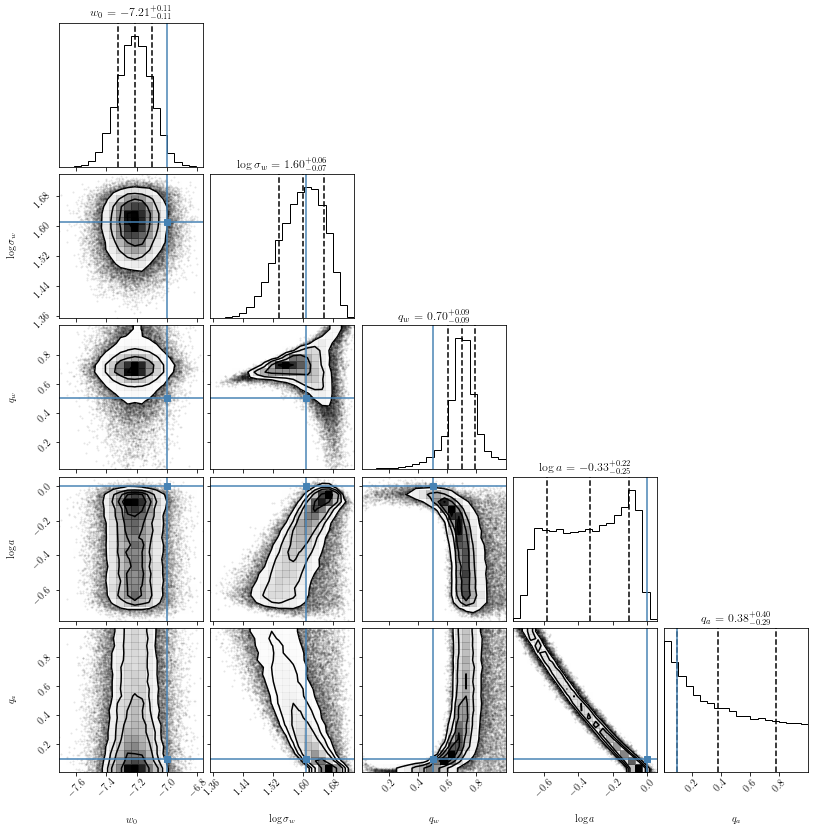

100%|██████████| 50000/50000 [00:01<00:00, 36268.13it/s]


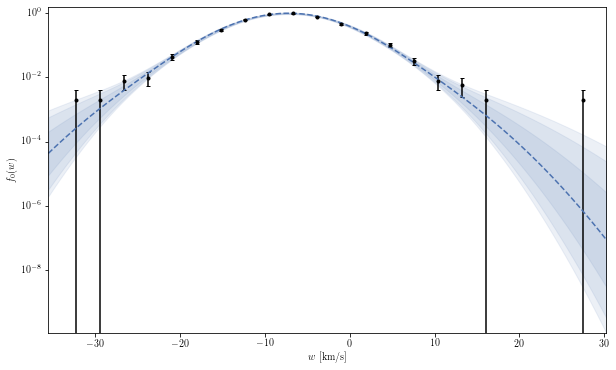

saving 05000
starting with 10000
running...
mcmc... w_10000


mcmc:   0%|          | 0/3 [00:00<?, ?it/s]

0: first half mcmc done 0.1 s


mcmc:  33%|███▎      | 1/3 [00:00<00:00,  4.82it/s]

0: second half mcmc done 0.1 s
1: first half mcmc done 0.09 s


mcmc:  67%|██████▋   | 2/3 [00:00<00:00,  4.96it/s]

1: second half mcmc done 0.09 s
2: first half mcmc done 0.09 s


mcmc: 100%|██████████| 3/3 [00:00<00:00,  4.97it/s]

2: second half mcmc done 0.09 s



100%|██████████| 6/6 [00:00<00:00, 21.61it/s]


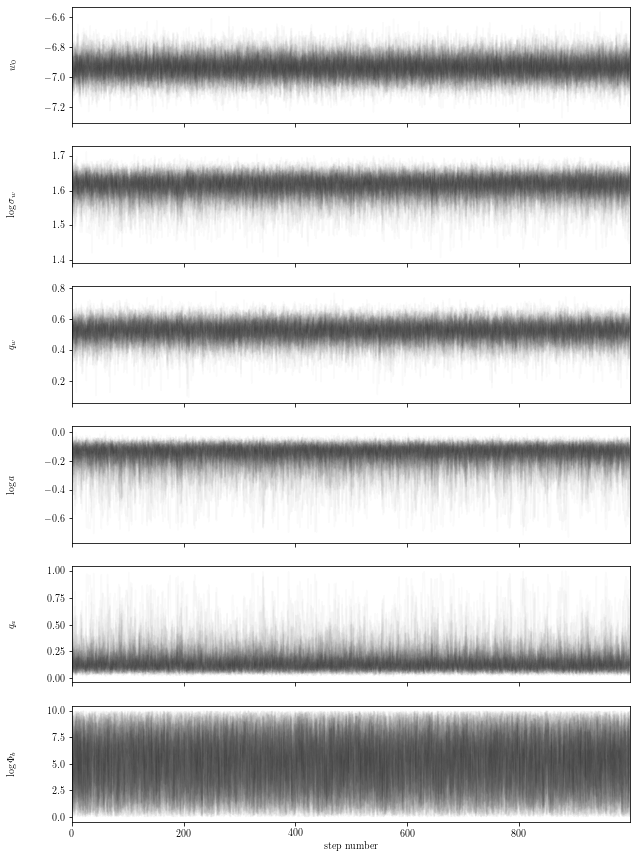

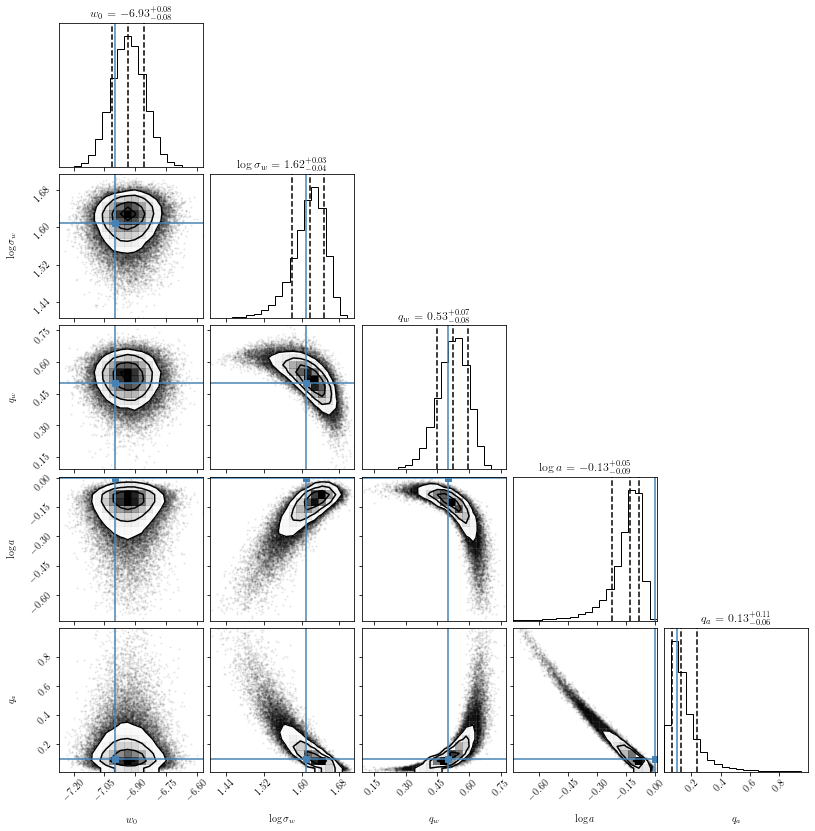

100%|██████████| 50000/50000 [00:01<00:00, 37331.71it/s]


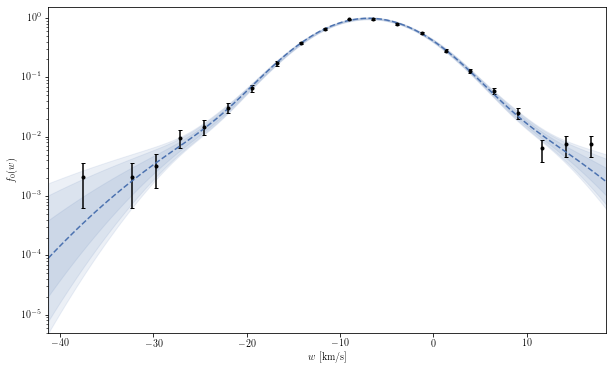

saving 10000


In [4]:
data_dir = join(root_data_dir, "MCMC-no", "mock", "result", "n", "vel")
w_dir_path = join(root_data_dir, 'MCMC-no', 'mock', 'data', 'n')
w_files = glob(join(w_dir_path, "w*"))
w_files.sort()

truths =[-7.00000000e+00,  1.60943791e+00,  5.00000000e-01,
        0.00000000e+00,  1.00000000e-01]

for file in w_files:
    name = file.split("/")[-1].replace(".hdf5", "").replace("w_", "")
    print("starting with {}".format(name))
    result = mcmc_w(
        model=Model.DM,
        w_path=file,
        step0=1000,
        step=300_000,
        burn=1000,
        it=3,
        thin=300,
        m=10,
    )
    indexes, labs, labels, chain = result.values()
    params = get_params(chain, indexes, labs)
    plot_chain(
        params=params,
        labels=labels,
        alpha=0.02,
        path=join(data_dir, "plots", f"chain_{name}.pdf")
    )
    plot_corner(
        params=params[:,:,:-1],
        labels=labels[:-1],
        truths=truths,
        path=join(data_dir, "plots", f"corner_{name}.pdf")
    )
    ndim = chain.shape[2]
    flat_chain = chain.reshape((-1, ndim))
    wdata = get_data(file)
    plot_fit_w(
        flat_chain=flat_chain,
        wdata=wdata,
        log=True,
        nsample=50_000,
        res=100,
        path=join(data_dir, "plots", f"fit_{name}.pdf")
    )
    print("saving", name)
    np.save(join(data_dir, "data", f"chain_{name}.npy"), flat_chain[:,:-1])

# comp

starting with 0005000
running...
mcmc... w_0005000


mcmc:  33%|███▎      | 1/3 [00:00<00:00,  2.79it/s]

0: first half mcmc done 0.24 s
0: second half mcmc done 0.1 s
1: first half mcmc done 0.09 s


mcmc:  67%|██████▋   | 2/3 [00:00<00:00,  3.74it/s]

1: second half mcmc done 0.1 s
2: first half mcmc done 0.1 s


mcmc: 100%|██████████| 3/3 [00:00<00:00,  3.90it/s]

2: second half mcmc done 0.09 s



100%|██████████| 6/6 [00:00<00:00, 47.07it/s]


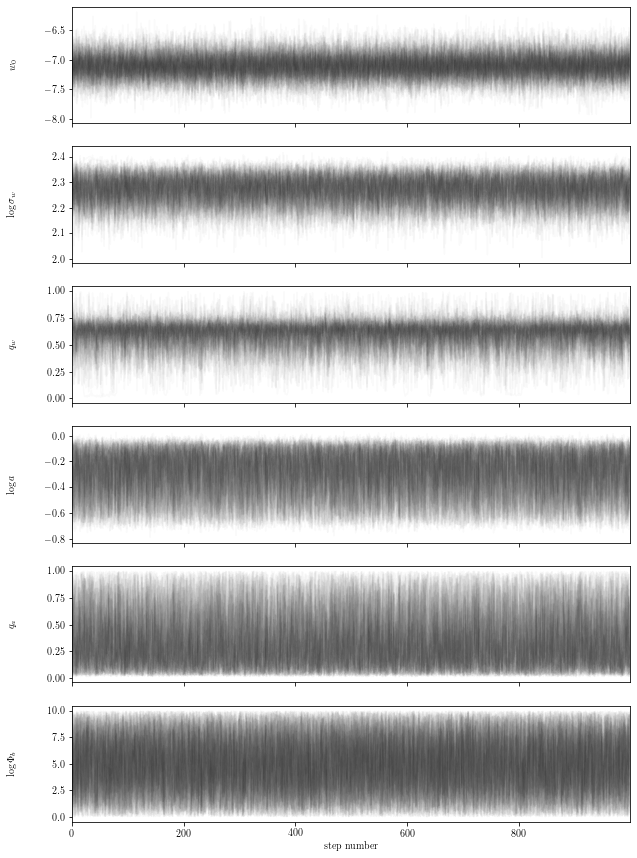

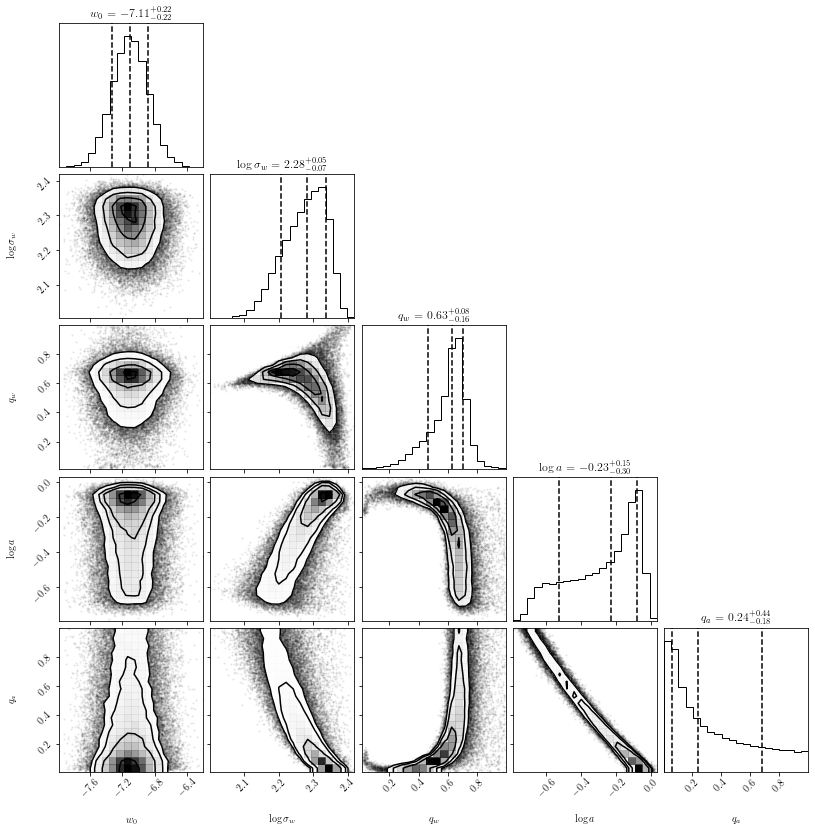

100%|██████████| 50000/50000 [00:01<00:00, 35695.61it/s]


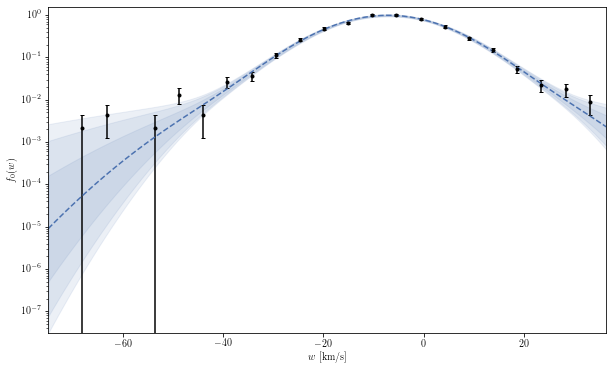

saving 0005000
starting with 0010000
running...
mcmc... w_0010000


mcmc:   0%|          | 0/3 [00:00<?, ?it/s]

0: first half mcmc done 0.09 s


mcmc:  33%|███▎      | 1/3 [00:00<00:00,  5.03it/s]

0: second half mcmc done 0.09 s
1: first half mcmc done 0.09 s


mcmc:  67%|██████▋   | 2/3 [00:00<00:00,  5.11it/s]

1: second half mcmc done 0.09 s
2: first half mcmc done 0.09 s


mcmc: 100%|██████████| 3/3 [00:00<00:00,  5.14it/s]

2: second half mcmc done 0.09 s



100%|██████████| 6/6 [00:00<00:00, 42.73it/s]


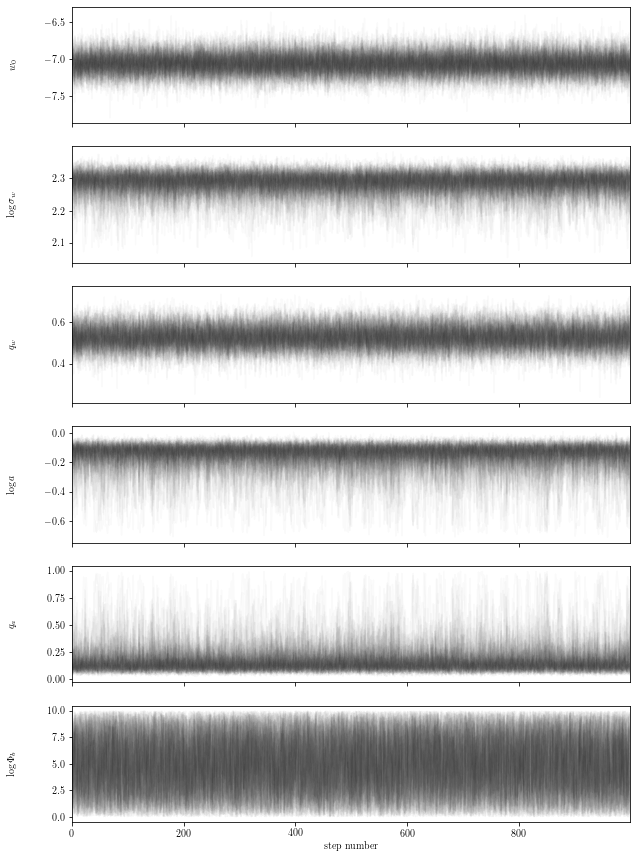

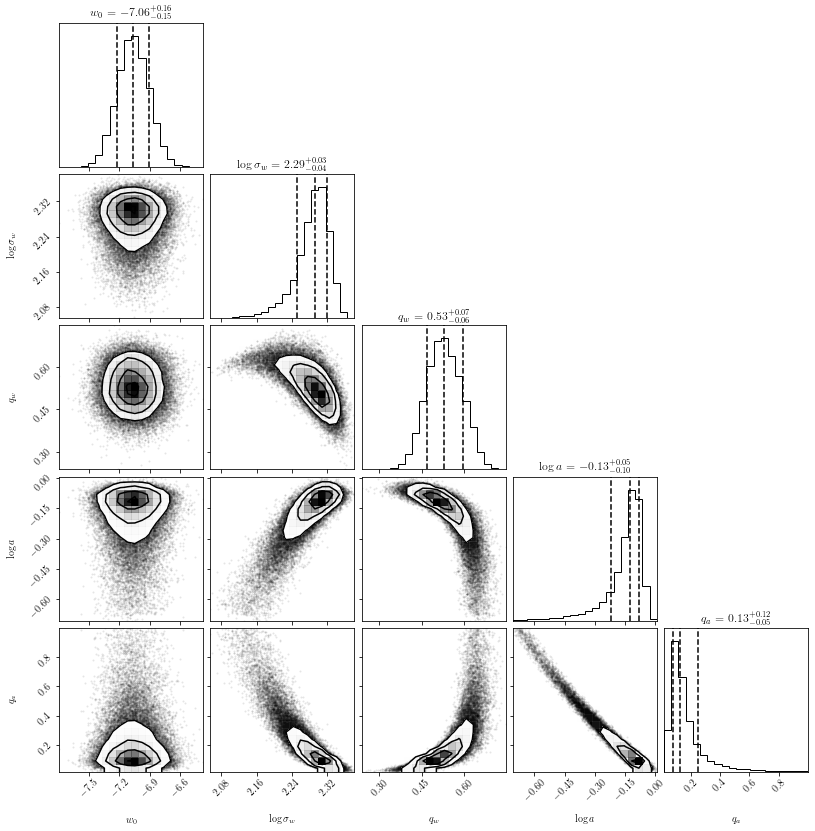

100%|██████████| 50000/50000 [00:01<00:00, 34136.10it/s]


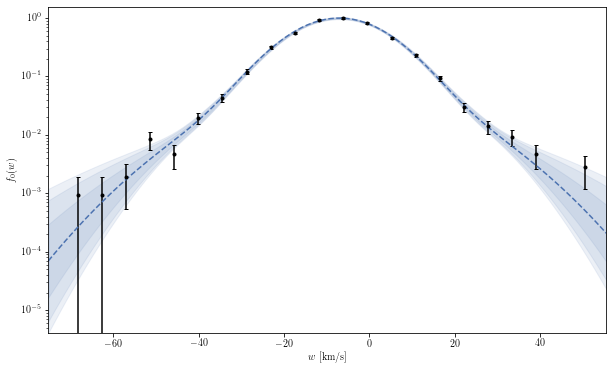

saving 0010000
starting with 0050000
running...
mcmc... w_0050000


mcmc:   0%|          | 0/3 [00:00<?, ?it/s]

0: first half mcmc done 0.11 s


mcmc:  33%|███▎      | 1/3 [00:00<00:00,  4.74it/s]

0: second half mcmc done 0.09 s
1: first half mcmc done 0.15 s


mcmc: 100%|██████████| 3/3 [00:00<00:00,  4.51it/s]

1: second half mcmc done 0.1 s
2: first half mcmc done 0.09 s
2: second half mcmc done 0.09 s



100%|██████████| 6/6 [00:00<00:00, 48.15it/s]


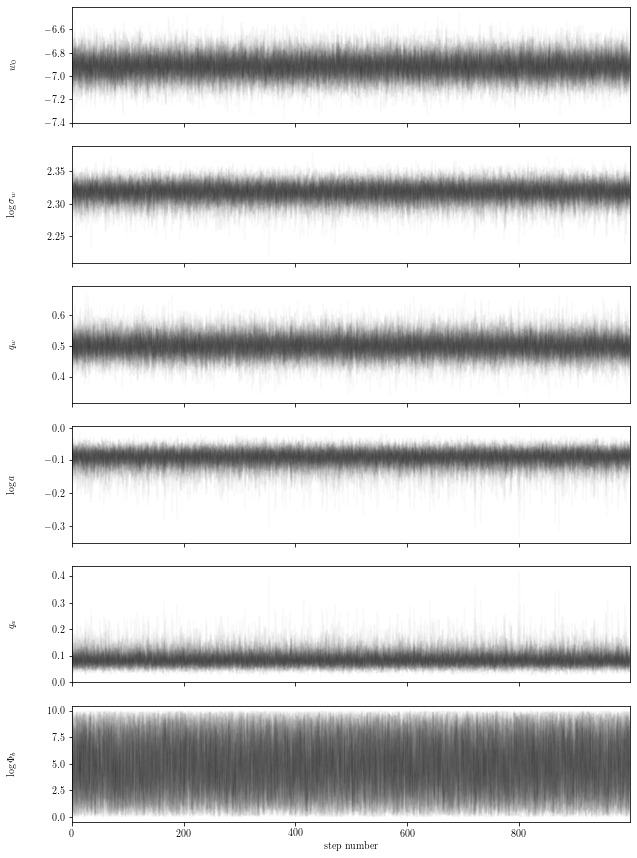

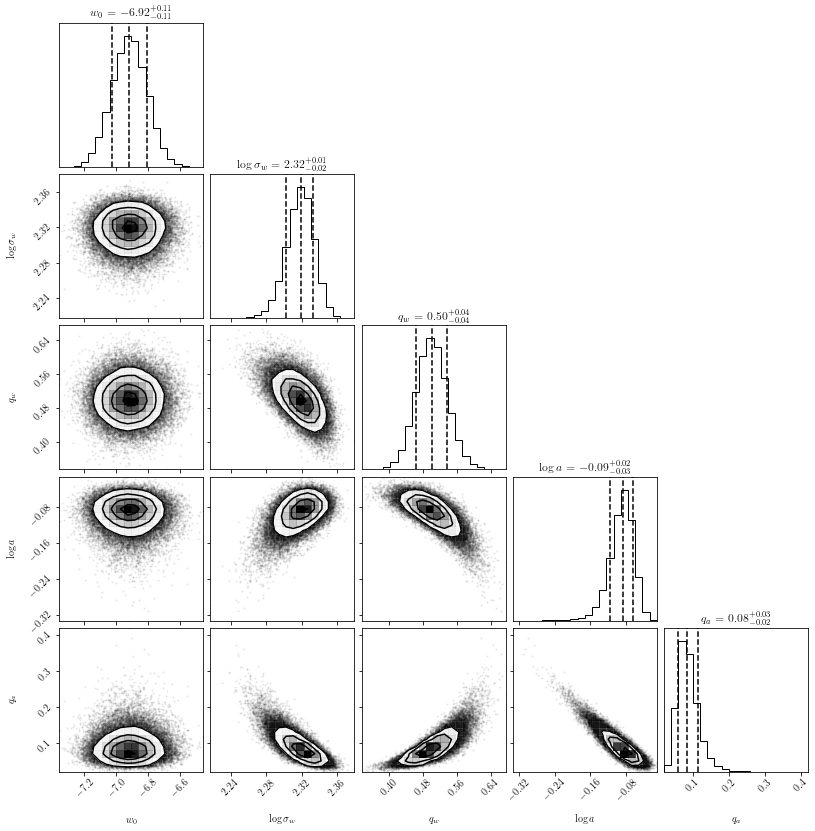

100%|██████████| 50000/50000 [00:01<00:00, 33455.51it/s]


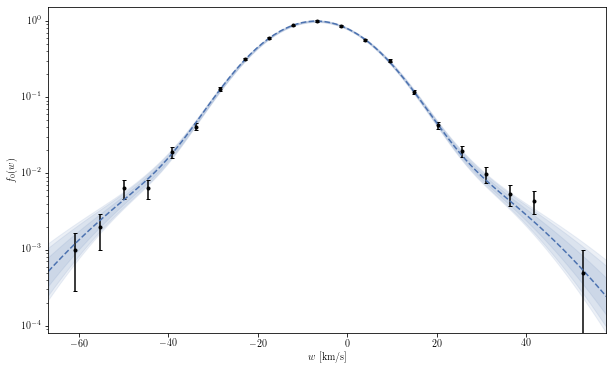

saving 0050000
starting with 0100000
running...
mcmc... w_0100000


mcmc:   0%|          | 0/3 [00:00<?, ?it/s]

0: first half mcmc done 0.1 s


mcmc:  33%|███▎      | 1/3 [00:00<00:00,  4.79it/s]

0: second half mcmc done 0.1 s
1: first half mcmc done 0.09 s


mcmc:  67%|██████▋   | 2/3 [00:00<00:00,  4.94it/s]

1: second half mcmc done 0.09 s
2: first half mcmc done 0.09 s


mcmc: 100%|██████████| 3/3 [00:00<00:00,  4.92it/s]

2: second half mcmc done 0.1 s



100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


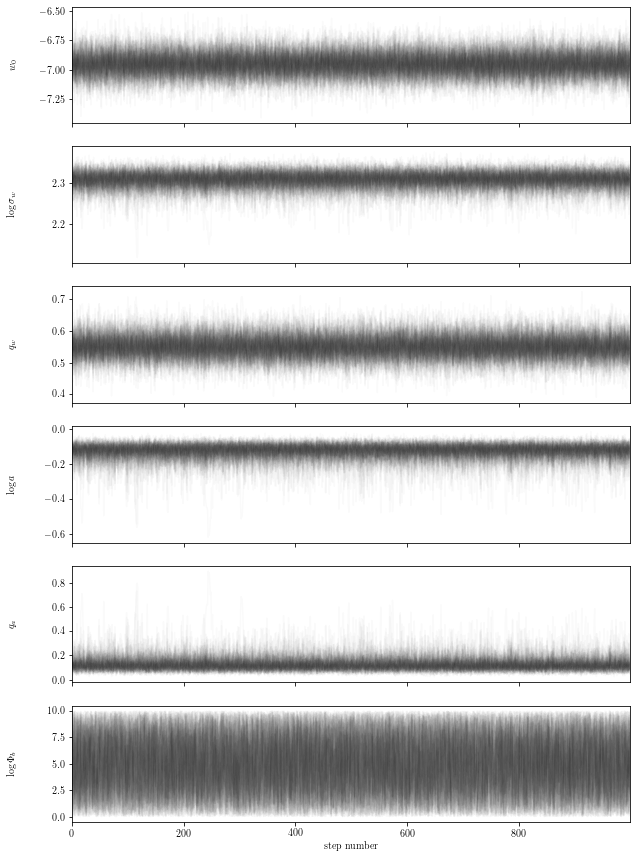

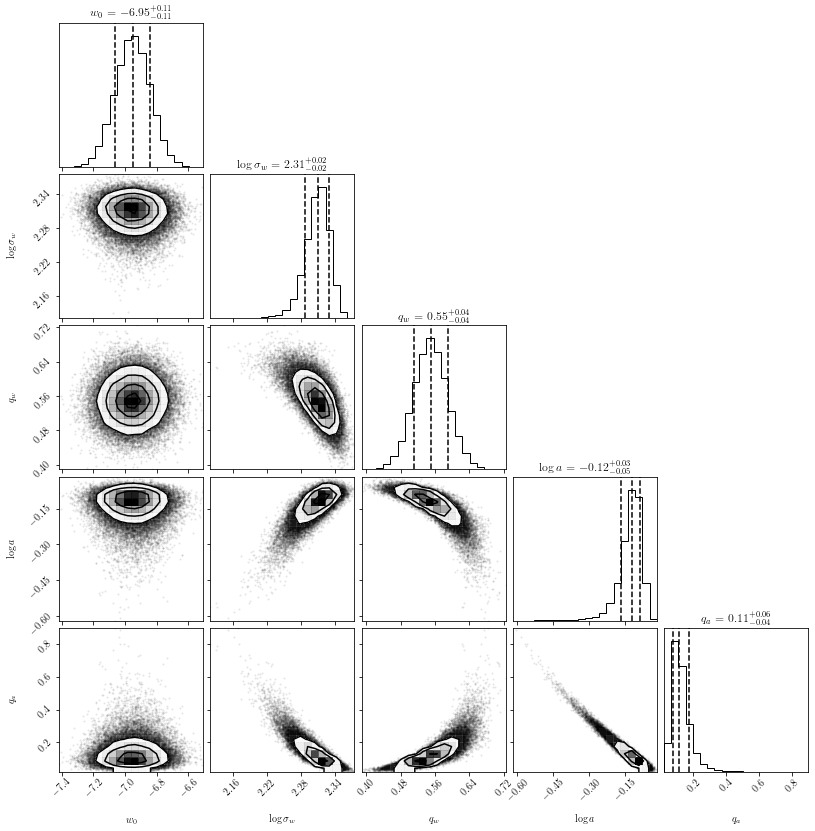

100%|██████████| 50000/50000 [00:01<00:00, 32337.51it/s]


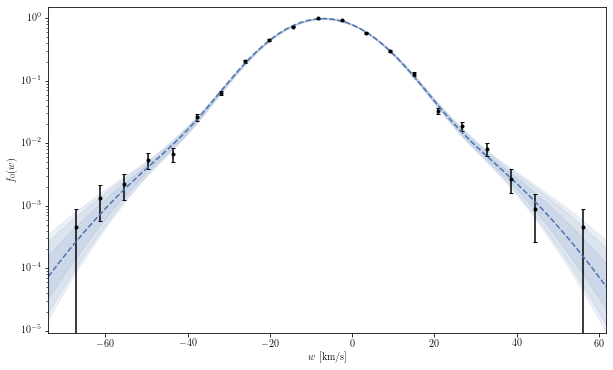

saving 0100000
starting with 0500000
running...
mcmc... w_0500000


mcmc:  33%|███▎      | 1/3 [00:00<00:00,  2.99it/s]

0: first half mcmc done 0.21 s
0: second half mcmc done 0.11 s
1: first half mcmc done 0.09 s


mcmc:  67%|██████▋   | 2/3 [00:00<00:00,  3.83it/s]

1: second half mcmc done 0.1 s
2: first half mcmc done 0.09 s


mcmc: 100%|██████████| 3/3 [00:00<00:00,  4.00it/s]

2: second half mcmc done 0.1 s



100%|██████████| 6/6 [00:00<00:00, 45.05it/s]


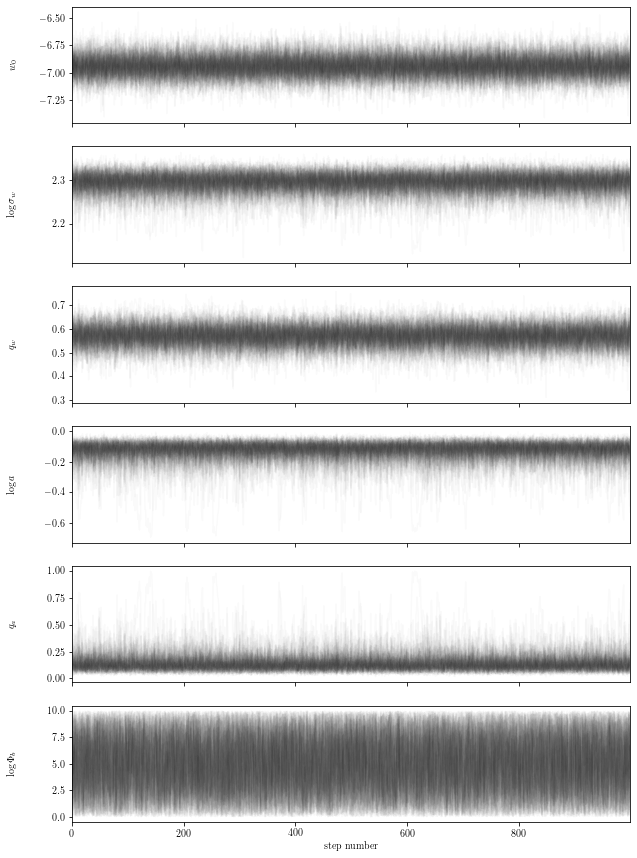

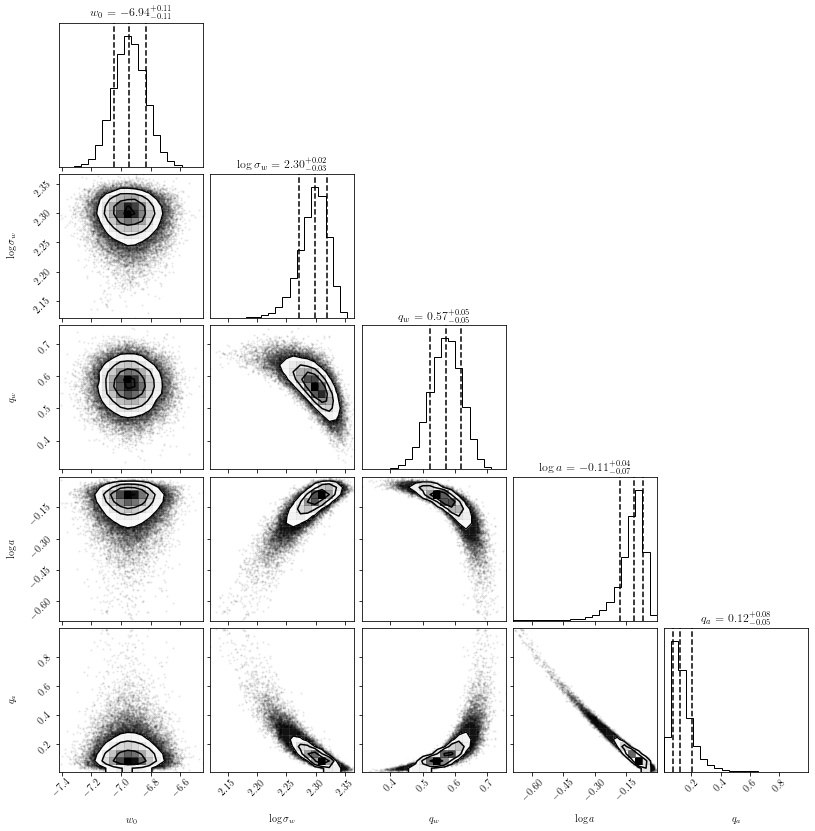

100%|██████████| 50000/50000 [00:01<00:00, 33624.02it/s]


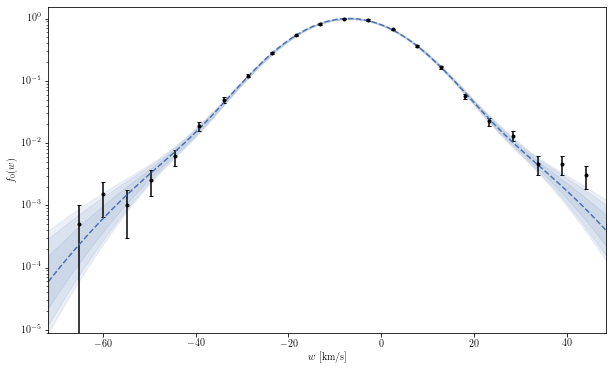

saving 0500000
starting with 1000000
running...
mcmc... w_1000000


mcmc:   0%|          | 0/3 [00:00<?, ?it/s]

0: first half mcmc done 0.11 s


mcmc:  33%|███▎      | 1/3 [00:00<00:00,  4.45it/s]

0: second half mcmc done 0.1 s
1: first half mcmc done 0.09 s


mcmc:  67%|██████▋   | 2/3 [00:00<00:00,  4.79it/s]

1: second half mcmc done 0.09 s
2: first half mcmc done 0.09 s


mcmc: 100%|██████████| 3/3 [00:00<00:00,  4.88it/s]

2: second half mcmc done 0.1 s


100%|██████████| 6/6 [00:00<00:00, 45.85it/s]


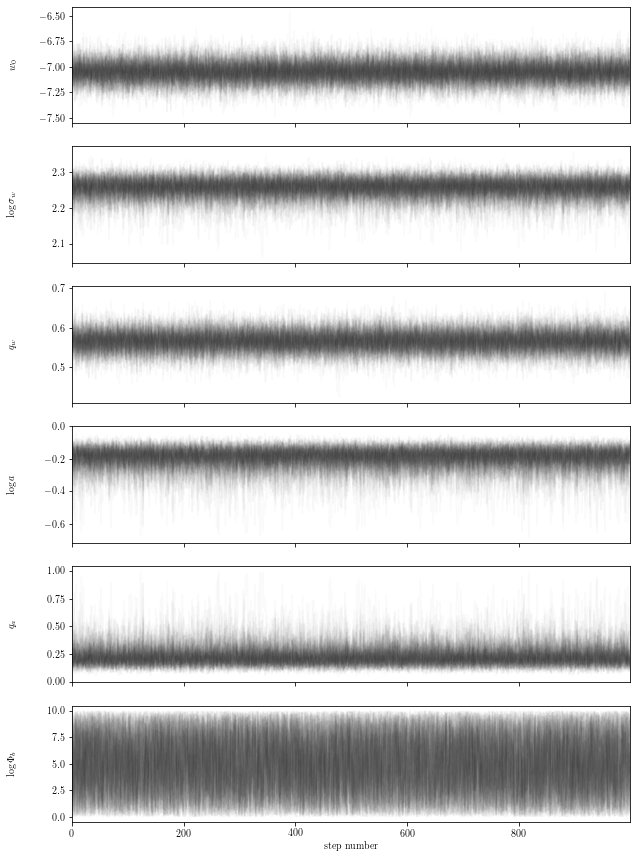

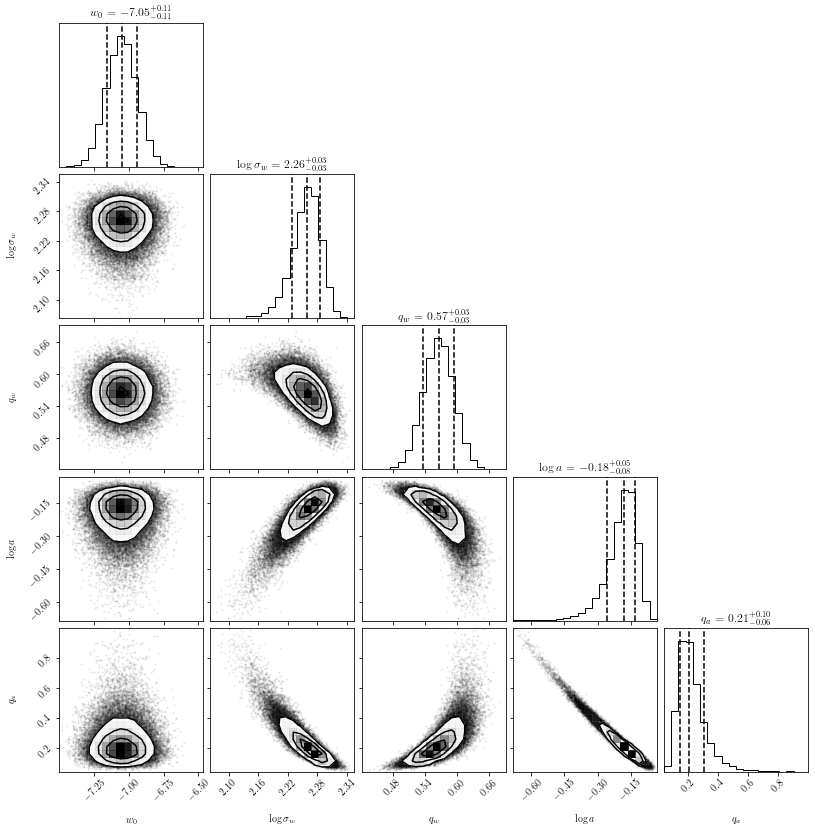

100%|██████████| 50000/50000 [00:01<00:00, 34376.24it/s]


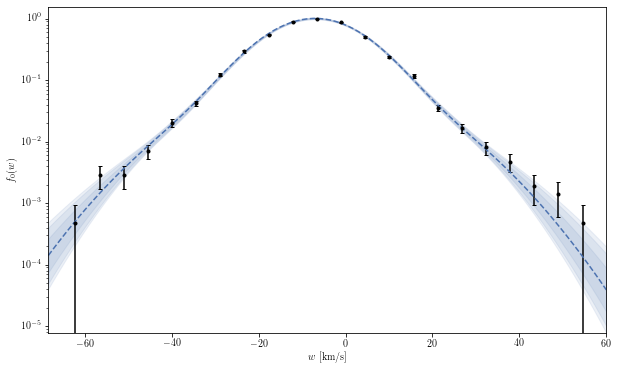

saving 1000000


In [5]:
data_dir = join(root_data_dir, "MCMC-no", "vel", "mock")
w_dir_path = join(root_data_dir, "MCMC-no", "mock", "data", "mock")
w_files = glob(join(w_dir_path, "w*"))
w_files.sort()

for file in w_files[1:]:
    name = file.split("/")[-1].replace(".hdf5", "").replace("w_", "")
    print("starting with {}".format(name))
    result = mcmc_w(
        model=Model.DM,
        w_path=file,
        step0=1000,
        step=300_000,
        burn=1000,
        it=3,
        thin=300,
        m=10,
    )
    indexes, labs, labels, chain = result.values()
    params = get_params(chain, indexes, labs)
    plot_chain(
        params=params,
        labels=labels,
        alpha=0.02,
        path=join(data_dir, "plots", f"chain_{name}.pdf")
    )
    plot_corner(
        params=params[:,:,:-1],
        labels=labels[:-1],
        path=join(data_dir, "plots", f"corner_{name}.pdf")
    )
    ndim = chain.shape[2]
    flat_chain = chain.reshape((-1, ndim))
    wdata = get_data(file)
    plot_fit_w(
        flat_chain=flat_chain,
        wdata=wdata,
        log=True,
        nsample=50_000,
        res=100,
        path=join(data_dir, "plots", f"fit_{name}.pdf")
    )
    print("saving", name)
    np.save(join(data_dir, "data", f"chain_{name}.npy"), flat_chain[:,:-1])
    # break